#Code paper(LSTM+Soft-Attention)

In [1]:
import os
import numpy as np
import h5py
import json
import torch
from PIL import Image

from tqdm import tqdm
from collections import Counter
from random import seed, choice, sample
import torch
from torch.utils.data import Dataset
import h5py
import json
import os

from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score

import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np
import json
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import skimage.transform
import argparse
from PIL import Image
from types import SimpleNamespace

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import time
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
from torch import nn
from torch.nn.utils.rnn import pack_padded_sequence
from datasets import *

from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


##Create input files

In [ ]:
def create_input_files(dataset, karpathy_json_path, image_folder, captions_per_image, min_word_freq, output_folder,
                       max_len=100):
    """
    Creates input files for training, validation, and test data.

    :param dataset: name of dataset, one of 'coco', 'flickr8k', 'flickr30k'
    :param karpathy_json_path: path of Karpathy JSON file with splits and captions
    :param image_folder: folder with downloaded images
    :param captions_per_image: number of captions to sample per image
    :param min_word_freq: words occuring less frequently than this threshold are binned as <unk>s
    :param output_folder: folder to save files
    :param max_len: don't sample captions longer than this length
    """

    assert dataset in {'coco', 'flickr8k', 'flickr30k'}

    # Read Karpathy JSON
    with open(karpathy_json_path, 'r') as j:
        data = json.load(j)

    # Read image paths and captions for each image
    train_image_paths = []
    train_image_captions = []
    val_image_paths = []
    val_image_captions = []
    test_image_paths = []
    test_image_captions = []
    word_freq = Counter()

    for img in data['images']:
        captions = []
        for c in img['sentences']:
            # Update word frequency
            word_freq.update(c['tokens'])
            if len(c['tokens']) <= max_len:
                captions.append(c['tokens'])

        if len(captions) == 0:
            continue

        path = os.path.join(image_folder, img['filepath'], img['filename']) if dataset == 'coco' else os.path.join(
            image_folder, img['filename'])

        if img['split'] in {'train', 'restval'}:
            train_image_paths.append(path)
            train_image_captions.append(captions)
        elif img['split'] in {'val'}:
            val_image_paths.append(path)
            val_image_captions.append(captions)
        elif img['split'] in {'test'}:
            test_image_paths.append(path)
            test_image_captions.append(captions)

    # Sanity check
    assert len(train_image_paths) == len(train_image_captions)
    assert len(val_image_paths) == len(val_image_captions)
    assert len(test_image_paths) == len(test_image_captions)

    # Create word map
    words = [w for w in word_freq.keys() if word_freq[w] > min_word_freq]
    word_map = {k: v + 1 for v, k in enumerate(words)}
    word_map['<unk>'] = len(word_map) + 1
    word_map['<start>'] = len(word_map) + 1
    word_map['<end>'] = len(word_map) + 1
    word_map['<pad>'] = 0

    # Create a base/root name for all output files
    base_filename = dataset + '_' + str(captions_per_image) + '_cap_per_img_' + str(min_word_freq) + '_min_word_freq'

    # Save word map to a JSON
    with open(os.path.join(output_folder, 'WORDMAP_' + base_filename + '.json'), 'w') as j:
        json.dump(word_map, j)

    # Sample captions for each image, save images to HDF5 file, and captions and their lengths to JSON files
    seed(123)
    for impaths, imcaps, split in [(train_image_paths, train_image_captions, 'TRAIN'),
                                   (val_image_paths, val_image_captions, 'VAL'),
                                   (test_image_paths, test_image_captions, 'TEST')]:

        with h5py.File(os.path.join(output_folder, split + '_IMAGES_' + base_filename + '.hdf5'), 'a') as h:
            # Make a note of the number of captions we are sampling per image
            h.attrs['captions_per_image'] = captions_per_image

            # Create dataset inside HDF5 file to store images
            images = h.create_dataset('images', (len(impaths), 3, 256, 256), dtype='uint8')

            print("\nReading %s images and captions, storing to file...\n" % split)

            enc_captions = []
            caplens = []

            for i, path in enumerate(tqdm(impaths)):

                # Sample captions
                if len(imcaps[i]) < captions_per_image:
                    captions = imcaps[i] + [choice(imcaps[i]) for _ in range(captions_per_image - len(imcaps[i]))]
                else:
                    captions = sample(imcaps[i], k=captions_per_image)

                # Sanity check
                assert len(captions) == captions_per_image

                # Read images
               # Đọc ảnh bằng PIL
                img = Image.open(impaths[i]).convert('RGB')  # đảm bảo ảnh có 3 kênh RGB
                img = img.resize((256, 256), resample=Image.LANCZOS)  # resize bằng filter tốt

                # Chuyển sang numpy array
                img = np.array(img)  # shape: (256, 256, 3)
                img = img.transpose(2, 0, 1)  # shape: (3, 256, 256) theo PyTorch convention
                assert img.shape == (3, 256, 256)
                assert np.max(img) <= 255

                # Save image to HDF5 file
                images[i] = img

                for j, c in enumerate(captions):
                    # Encode captions
                    enc_c = [word_map['<start>']] + [word_map.get(word, word_map['<unk>']) for word in c] + [
                        word_map['<end>']] + [word_map['<pad>']] * (max_len - len(c))

                    # Find caption lengths
                    c_len = len(c) + 2

                    enc_captions.append(enc_c)
                    caplens.append(c_len)

            # Sanity check
            assert images.shape[0] * captions_per_image == len(enc_captions) == len(caplens)

            # Save encoded captions and their lengths to JSON files
            with open(os.path.join(output_folder, split + '_CAPTIONS_' + base_filename + '.json'), 'w') as j:
                json.dump(enc_captions, j)

            with open(os.path.join(output_folder, split + '_CAPLENS_' + base_filename + '.json'), 'w') as j:
                json.dump(caplens, j)


def init_embedding(embeddings):
    """
    Fills embedding tensor with values from the uniform distribution.

    :param embeddings: embedding tensor
    """
    bias = np.sqrt(3.0 / embeddings.size(1))
    torch.nn.init.uniform_(embeddings, -bias, bias)


def load_embeddings(emb_file, word_map):
    """
    Creates an embedding tensor for the specified word map, for loading into the model.

    :param emb_file: file containing embeddings (stored in GloVe format)
    :param word_map: word map
    :return: embeddings in the same order as the words in the word map, dimension of embeddings
    """

    # Find embedding dimension
    with open(emb_file, 'r') as f:
        emb_dim = len(f.readline().split(' ')) - 1

    vocab = set(word_map.keys())

    # Create tensor to hold embeddings, initialize
    embeddings = torch.FloatTensor(len(vocab), emb_dim)
    init_embedding(embeddings)

    # Read embedding file
    print("\nLoading embeddings...")
    for line in open(emb_file, 'r'):
        line = line.split(' ')

        emb_word = line[0]
        embedding = list(map(lambda t: float(t), filter(lambda n: n and not n.isspace(), line[1:])))

        # Ignore word if not in train_vocab
        if emb_word not in vocab:
            continue

        embeddings[word_map[emb_word]] = torch.FloatTensor(embedding)

    return embeddings, emb_dim


def clip_gradient(optimizer, grad_clip):
    """
    Clips gradients computed during backpropagation to avoid explosion of gradients.

    :param optimizer: optimizer with the gradients to be clipped
    :param grad_clip: clip value
    """
    for group in optimizer.param_groups:
        for param in group['params']:
            if param.grad is not None:
                param.grad.data.clamp_(-grad_clip, grad_clip)


def save_checkpoint(data_name, epoch, epochs_since_improvement, encoder, decoder, encoder_optimizer, decoder_optimizer,
                    bleu4, is_best):
    """
    Saves model checkpoint.

    :param data_name: base name of processed dataset
    :param epoch: epoch number
    :param epochs_since_improvement: number of epochs since last improvement in BLEU-4 score
    :param encoder: encoder model
    :param decoder: decoder model
    :param encoder_optimizer: optimizer to update encoder's weights, if fine-tuning
    :param decoder_optimizer: optimizer to update decoder's weights
    :param bleu4: validation BLEU-4 score for this epoch
    :param is_best: is this checkpoint the best so far?
    """
    state = {'epoch': epoch,
             'epochs_since_improvement': epochs_since_improvement,
             'bleu-4': bleu4,
             'encoder': encoder,
             'decoder': decoder,
             'encoder_optimizer': encoder_optimizer,
             'decoder_optimizer': decoder_optimizer}
    filename = 'checkpoint_' + data_name + '.pth.tar'
    torch.save(state, filename)
    # If this checkpoint is the best so far, store a copy so it doesn't get overwritten by a worse checkpoint
    if is_best:
        torch.save(state, 'BEST_' + filename)


class AverageMeter(object):
    """
    Keeps track of most recent, average, sum, and count of a metric.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


def adjust_learning_rate(optimizer, shrink_factor):
    """
    Shrinks learning rate by a specified factor.

    :param optimizer: optimizer whose learning rate must be shrunk.
    :param shrink_factor: factor in interval (0, 1) to multiply learning rate with.
    """

    print("\nDECAYING learning rate.")
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr'] * shrink_factor
    print("The new learning rate is %f\n" % (optimizer.param_groups[0]['lr'],))


def accuracy(scores, targets, k):
    """
    Computes top-k accuracy, from predicted and true labels.

    :param scores: scores from the model
    :param targets: true labels
    :param k: k in top-k accuracy
    :return: top-k accuracy
    """

    batch_size = targets.size(0)
    _, ind = scores.topk(k, 1, True, True)
    correct = ind.eq(targets.view(-1, 1).expand_as(ind))
    correct_total = correct.view(-1).float().sum()  # 0D tensor
    return correct_total.item() * (100.0 / batch_size)


In [ ]:
!unzip fl8k.zip -d /content/drive/MyDrive/CV/data

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: /content/drive/MyDrive/CV/data/Images/2844963839_ff09cdb81f.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2845691057_d4ab89d889.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2845845721_d0bc113ff7.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2846037553_1a1de50709.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2846785268_904c5fcf9f.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2846843520_b0e6211478.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2847514745_9a35493023.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2847615962_c330bded6e.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2847859796_4d9cb0d31f.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2848266893_9693c66275.jpg  
  inflating: /content/drive/MyDrive/CV/data/Images/2848571082_26454cb981.j

In [ ]:
if __name__ == '__main__':
    # Create input files (along with word map)
    create_input_files(dataset='flickr8k',
                       karpathy_json_path='/content/dataset_flickr8k.json',
                       image_folder='/content/Images/',
                       captions_per_image=5,
                       min_word_freq=5,
                       output_folder='/content/data/',
                       max_len=50)



Reading TRAIN images and captions, storing to file...



100%|██████████| 6000/6000 [00:42<00:00, 139.93it/s]



Reading VAL images and captions, storing to file...



100%|██████████| 1000/1000 [00:07<00:00, 140.40it/s]



Reading TEST images and captions, storing to file...



100%|██████████| 1000/1000 [00:07<00:00, 125.75it/s]


##Utils

In [ ]:

def init_embedding(embeddings):
    """
    Fills embedding tensor with values from the uniform distribution.

    :param embeddings: embedding tensor
    """
    bias = np.sqrt(3.0 / embeddings.size(1))
    torch.nn.init.uniform_(embeddings, -bias, bias)


def load_embeddings(emb_file, word_map):
    """
    Creates an embedding tensor for the specified word map, for loading into the model.

    :param emb_file: file containing embeddings (stored in GloVe format)
    :param word_map: word map
    :return: embeddings in the same order as the words in the word map, dimension of embeddings
    """

    # Find embedding dimension
    with open(emb_file, 'r') as f:
        emb_dim = len(f.readline().split(' ')) - 1

    vocab = set(word_map.keys())

    # Create tensor to hold embeddings, initialize
    embeddings = torch.FloatTensor(len(vocab), emb_dim)
    init_embedding(embeddings)

    # Read embedding file
    print("\nLoading embeddings...")
    for line in open(emb_file, 'r'):
        line = line.split(' ')

        emb_word = line[0]
        embedding = list(map(lambda t: float(t), filter(lambda n: n and not n.isspace(), line[1:])))

        # Ignore word if not in train_vocab
        if emb_word not in vocab:
            continue

        embeddings[word_map[emb_word]] = torch.FloatTensor(embedding)

    return embeddings, emb_dim


def clip_gradient(optimizer, grad_clip):
    """
    Clips gradients computed during backpropagation to avoid explosion of gradients.

    :param optimizer: optimizer with the gradients to be clipped
    :param grad_clip: clip value
    """
    for group in optimizer.param_groups:
        for param in group['params']:
            if param.grad is not None:
                param.grad.data.clamp_(-grad_clip, grad_clip)


def save_checkpoint(data_name, epoch, epochs_since_improvement, encoder, decoder, encoder_optimizer, decoder_optimizer,
                    bleu4, is_best):
    """
    Saves model checkpoint.

    :param data_name: base name of processed dataset
    :param epoch: epoch number
    :param epochs_since_improvement: number of epochs since last improvement in BLEU-4 score
    :param encoder: encoder model
    :param decoder: decoder model
    :param encoder_optimizer: optimizer to update encoder's weights, if fine-tuning
    :param decoder_optimizer: optimizer to update decoder's weights
    :param bleu4: validation BLEU-4 score for this epoch
    :param is_best: is this checkpoint the best so far?
    """
    state = {'epoch': epoch,
             'epochs_since_improvement': epochs_since_improvement,
             'bleu-4': bleu4,
             'encoder': encoder,
             'decoder': decoder,
             'encoder_optimizer': encoder_optimizer,
             'decoder_optimizer': decoder_optimizer}
    filename = 'checkpoint_' + data_name + '.pth.tar'
    torch.save(state, filename)
    # If this checkpoint is the best so far, store a copy so it doesn't get overwritten by a worse checkpoint
    if is_best:
        torch.save(state, 'BEST_' + filename)


class AverageMeter(object):
    """
    Keeps track of most recent, average, sum, and count of a metric.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


def adjust_learning_rate(optimizer, shrink_factor):
    """
    Shrinks learning rate by a specified factor.

    :param optimizer: optimizer whose learning rate must be shrunk.
    :param shrink_factor: factor in interval (0, 1) to multiply learning rate with.
    """

    print("\nDECAYING learning rate.")
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr'] * shrink_factor
    print("The new learning rate is %f\n" % (optimizer.param_groups[0]['lr'],))


def accuracy(scores, targets, k):
    """
    Computes top-k accuracy, from predicted and true labels.

    :param scores: scores from the model
    :param targets: true labels
    :param k: k in top-k accuracy
    :return: top-k accuracy
    """

    batch_size = targets.size(0)
    _, ind = scores.topk(k, 1, True, True)
    correct = ind.eq(targets.view(-1, 1).expand_as(ind))
    correct_total = correct.view(-1).float().sum()  # 0D tensor
    return correct_total.item() * (100.0 / batch_size)

##Captiondataset

In [ ]:
class CaptionDataset(Dataset):
    """
    A PyTorch Dataset class to be used in a PyTorch DataLoader to create batches.
    """

    def __init__(self, data_folder, data_name, split, transform=None):
        """
        :param data_folder: folder where data files are stored
        :param data_name: base name of processed datasets
        :param split: split, one of 'TRAIN', 'VAL', or 'TEST'
        :param transform: image transform pipeline
        """
        self.split = split
        assert self.split in {'TRAIN', 'VAL', 'TEST'}

        # Open hdf5 file where images are stored
        self.h = h5py.File(os.path.join(data_folder, self.split + '_IMAGES_' + data_name + '.hdf5'), 'r')
        self.imgs = self.h['images']

        # Captions per image
        self.cpi = self.h.attrs['captions_per_image']

        # Load encoded captions (completely into memory)
        with open(os.path.join(data_folder, self.split + '_CAPTIONS_' + data_name + '.json'), 'r') as j:
            self.captions = json.load(j)

        # Load caption lengths (completely into memory)
        with open(os.path.join(data_folder, self.split + '_CAPLENS_' + data_name + '.json'), 'r') as j:
            self.caplens = json.load(j)

        # PyTorch transformation pipeline for the image (normalizing, etc.)
        self.transform = transform

        # Total number of datapoints
        self.dataset_size = len(self.captions)

    def __getitem__(self, i):
        # Remember, the Nth caption corresponds to the (N // captions_per_image)th image
        img = torch.FloatTensor(self.imgs[i // self.cpi] / 255.)
        if self.transform is not None:
            img = self.transform(img)

        caption = torch.LongTensor(self.captions[i])

        caplen = torch.LongTensor([self.caplens[i]])

        if self.split == 'TRAIN':
            return img, caption, caplen
        else:
            # For validation of testing, also return all 'captions_per_image' captions to find BLEU-4 score
            all_captions = torch.LongTensor(
                self.captions[((i // self.cpi) * self.cpi):(((i // self.cpi) * self.cpi) + self.cpi)])
            return img, caption, caplen, all_captions

    def __len__(self):
        return self.dataset_size


##Model

In [ ]:
import torch
from torch import nn
import torchvision

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class Encoder(nn.Module):
    """
    Encoder.
    """

    def __init__(self, encoded_image_size=14):
        super(Encoder, self).__init__()
        self.enc_image_size = encoded_image_size

        resnet = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V1)# pretrained ImageNet ResNet-101

        # Remove linear and pool layers (since we're not doing classification)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        # Resize image to fixed size to allow input images of variable size
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))

        self.fine_tune()

    def forward(self, images):
        """
        Forward propagation.

        :param images: images, a tensor of dimensions (batch_size, 3, image_size, image_size)
        :return: encoded images
        """
        out = self.resnet(images)  # (batch_size, 2048, image_size/32, image_size/32)
        out = self.adaptive_pool(out)  # (batch_size, 2048, encoded_image_size, encoded_image_size)
        out = out.permute(0, 2, 3, 1)  # (batch_size, encoded_image_size, encoded_image_size, 2048)
        return out

    def fine_tune(self, fine_tune=True):
        """
        Allow or prevent the computation of gradients for convolutional blocks 2 through 4 of the encoder.

        :param fine_tune: Allow?
        """
        for p in self.resnet.parameters():
            p.requires_grad = False
        # If fine-tuning, only fine-tune convolutional blocks 2 through 4
        for c in list(self.resnet.children())[5:]:
            for p in c.parameters():
                p.requires_grad = fine_tune


class Attention(nn.Module):
    """
    Attention Network.
    """

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        """
        :param encoder_dim: feature size of encoded images
        :param decoder_dim: size of decoder's RNN
        :param attention_dim: size of the attention network
        """
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  # linear layer to transform encoded image
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  # linear layer to transform decoder's output
        self.full_att = nn.Linear(attention_dim, 1)  # linear layer to calculate values to be softmax-ed
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)  # softmax layer to calculate weights

    def forward(self, encoder_out, decoder_hidden):
        """
        Forward propagation.

        :param encoder_out: encoded images, a tensor of dimension (batch_size, num_pixels, encoder_dim)
        :param decoder_hidden: previous decoder output, a tensor of dimension (batch_size, decoder_dim)
        :return: attention weighted encoding, weights
        """
        att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
        att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)

        return attention_weighted_encoding, alpha


class DecoderWithAttention(nn.Module):
    """
    Decoder.
    """

    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2048, dropout=0.5):
        """
        :param attention_dim: size of attention network
        :param embed_dim: embedding size
        :param decoder_dim: size of decoder's RNN
        :param vocab_size: size of vocabulary
        :param encoder_dim: feature size of encoded images
        :param dropout: dropout
        """
        super(DecoderWithAttention, self).__init__()

        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout

        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)  # attention network

        self.embedding = nn.Embedding(vocab_size, embed_dim)  # embedding layer
        self.dropout = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)  # decoding LSTMCell
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial hidden state of LSTMCell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial cell state of LSTMCell
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)  # linear layer to create a sigmoid-activated gate
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size)  # linear layer to find scores over vocabulary
        self.init_weights()  # initialize some layers with the uniform distribution

    def init_weights(self):
        """
        Initializes some parameters with values from the uniform distribution, for easier convergence.
        """
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def load_pretrained_embeddings(self, embeddings):
        """
        Loads embedding layer with pre-trained embeddings.

        :param embeddings: pre-trained embeddings
        """
        self.embedding.weight = nn.Parameter(embeddings)

    def fine_tune_embeddings(self, fine_tune=True):
        """
        Allow fine-tuning of embedding layer? (Only makes sense to not-allow if using pre-trained embeddings).

        :param fine_tune: Allow?
        """
        for p in self.embedding.parameters():
            p.requires_grad = fine_tune

    def init_hidden_state(self, encoder_out):
        """
        Creates the initial hidden and cell states for the decoder's LSTM based on the encoded images.

        :param encoder_out: encoded images, a tensor of dimension (batch_size, num_pixels, encoder_dim)
        :return: hidden state, cell state
        """
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        """
        Forward propagation.

        :param encoder_out: encoded images, a tensor of dimension (batch_size, enc_image_size, enc_image_size, encoder_dim)
        :param encoded_captions: encoded captions, a tensor of dimension (batch_size, max_caption_length)
        :param caption_lengths: caption lengths, a tensor of dimension (batch_size, 1)
        :return: scores for vocabulary, sorted encoded captions, decode lengths, weights, sort indices
        """

        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size

        # Flatten image
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (batch_size, num_pixels, encoder_dim)
        num_pixels = encoder_out.size(1)

        # Sort input data by decreasing lengths; why? apparent below
        caption_lengths, sort_ind = caption_lengths.squeeze(1).sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]

        # Embedding
        embeddings = self.embedding(encoded_captions)  # (batch_size, max_caption_length, embed_dim)

        # Initialize LSTM state
        h, c = self.init_hidden_state(encoder_out)  # (batch_size, decoder_dim)

        # We won't decode at the <end> position, since we've finished generating as soon as we generate <end>
        # So, decoding lengths are actual lengths - 1
        decode_lengths = (caption_lengths - 1).tolist()

        # Create tensors to hold word predicion scores and alphas
        predictions = torch.zeros(batch_size, max(decode_lengths), vocab_size).to(device)
        alphas = torch.zeros(batch_size, max(decode_lengths), num_pixels).to(device)

        # At each time-step, decode by
        # attention-weighing the encoder's output based on the decoder's previous hidden state output
        # then generate a new word in the decoder with the previous word and the attention weighted encoding
        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])
            attention_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t],
                                                                h[:batch_size_t])
            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))  # gating scalar, (batch_size_t, encoder_dim)
            attention_weighted_encoding = gate * attention_weighted_encoding
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_t, t, :], attention_weighted_encoding], dim=1),
                (h[:batch_size_t], c[:batch_size_t]))  # (batch_size_t, decoder_dim)
            preds = self.fc(self.dropout(h))  # (batch_size_t, vocab_size)
            predictions[:batch_size_t, t, :] = preds
            alphas[:batch_size_t, t, :] = alpha

        return predictions, encoded_captions, decode_lengths, alphas, sort_ind

##Train

In [ ]:

# Data parameters
data_folder = '/content/data/'  # folder with data files saved by create_input_files.py
data_name = 'flickr8k_5_cap_per_img_5_min_word_freq'  # base name shared by data files

# Model parameters
emb_dim = 512  # dimension of word embeddings
attention_dim = 512  # dimension of attention linear layers
decoder_dim = 512  # dimension of decoder RNN
dropout = 0.5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # sets device for model and PyTorch tensors
cudnn.benchmark = True  # set to true only if inputs to model are fixed size; otherwise lot of computational overhead

# Training parameters
start_epoch = 0
epochs = 50  # number of epochs to train for (if early stopping is not triggered)
epochs_since_improvement = 0  # keeps track of number of epochs since there's been an improvement in validation BLEU
batch_size = 64
workers = 0  # for data-loading; right now, only 1 works with h5py
encoder_lr = 1e-4  # learning rate for encoder if fine-tuning
decoder_lr = 4e-4  # learning rate for decoder
grad_clip = 5.  # clip gradients at an absolute value of
alpha_c = 1.  # regularization parameter for 'doubly stochastic attention', as in the paper
best_bleu4 = 0.  # BLEU-4 score right now
print_freq = 1000  # print training/validation stats every __ batches
fine_tune_encoder = False  # fine-tune encoder?
checkpoint = None  # path to checkpoint, None if none


def train(train_loader, encoder, decoder, criterion, encoder_optimizer, decoder_optimizer, epoch):
    decoder.train()
    encoder.train()

    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    top5accs = AverageMeter()

    start = time.time()

    loop = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training")
    for i, (imgs, caps, caplens) in loop:
        data_time.update(time.time() - start)

        imgs = imgs.to(device)
        caps = caps.to(device)
        caplens = caplens.to(device)

        imgs = encoder(imgs)
        scores, caps_sorted, decode_lengths, alphas, sort_ind = decoder(imgs, caps, caplens)

        targets = caps_sorted[:, 1:]

        scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
        targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data

        loss = criterion(scores, targets)
        loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()

        decoder_optimizer.zero_grad()
        if encoder_optimizer is not None:
            encoder_optimizer.zero_grad()
        loss.backward()

        if grad_clip is not None:
            clip_gradient(decoder_optimizer, grad_clip)
            if encoder_optimizer is not None:
                clip_gradient(encoder_optimizer, grad_clip)

        decoder_optimizer.step()
        if encoder_optimizer is not None:
            encoder_optimizer.step()

        top5 = accuracy(scores, targets, 5)
        losses.update(loss.item(), sum(decode_lengths))
        top5accs.update(top5, sum(decode_lengths))
        batch_time.update(time.time() - start)

        start = time.time()

    # In ra sau mỗi epoch
    print(f'\n===> Epoch {epoch}: Train Loss = {losses.avg:.4f}, Top-5 Accuracy = {top5accs.avg:.2f}%\n')

    # Trả về các chỉ số
    return losses.avg





def validate(val_loader, encoder, decoder, criterion):
    """
    Performs one epoch's validation.

    :param val_loader: DataLoader for validation data.
    :param encoder: encoder model
    :param decoder: decoder model
    :param criterion: loss layer
    :return: BLEU-4 score
    """
    decoder.eval()  # eval mode (no dropout or batchnorm)
    if encoder is not None:
        encoder.eval()

    batch_time = AverageMeter()
    losses = AverageMeter()
    top5accs = AverageMeter()

    start = time.time()

    references = list()  # references (true captions) for calculating BLEU-4 score
    hypotheses = list()  # hypotheses (predictions)

    # explicitly disable gradient calculation to avoid CUDA memory error
    # solves the issue #57
    with torch.no_grad():
        # Batches
        loop = tqdm(enumerate(val_loader), total=len(val_loader), desc="Validation")
        for i, (imgs, caps, caplens, allcaps) in loop:

            # Move to device, if available
            imgs = imgs.to(device)
            caps = caps.to(device)
            caplens = caplens.to(device)

            # Forward prop.
            if encoder is not None:
                imgs = encoder(imgs)
            scores, caps_sorted, decode_lengths, alphas, sort_ind = decoder(imgs, caps, caplens)

            # Since we decoded starting with <start>, the targets are all words after <start>, up to <end>
            targets = caps_sorted[:, 1:]

            # Remove timesteps that we didn't decode at, or are pads
            # pack_padded_sequence is an easy trick to do this
            scores_copy = scores.clone()
            scores= pack_padded_sequence(scores, decode_lengths, batch_first=True).data
            targets= pack_padded_sequence(targets, decode_lengths, batch_first=True).data

            # Calculate loss
            loss = criterion(scores, targets)

            # Add doubly stochastic attention regularization
            loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()

            # Keep track of metrics
            losses.update(loss.item(), sum(decode_lengths))
            top5 = accuracy(scores, targets, 5)
            top5accs.update(top5, sum(decode_lengths))
            batch_time.update(time.time() - start)

            start = time.time()

            # Store references (true captions), and hypothesis (prediction) for each image
            # If for n images, we have n hypotheses, and references a, b, c... for each image, we need -
            # references = [[ref1a, ref1b, ref1c], [ref2a, ref2b], ...], hypotheses = [hyp1, hyp2, ...]

            # References
            allcaps=allcaps.to(device)
            sort_ind=sort_ind.to(device)
            allcaps = allcaps[sort_ind]  # because images were sorted in the decoder
            for j in range(allcaps.shape[0]):
                img_caps = allcaps[j].tolist()
                img_captions = list(
                    map(lambda c: [w for w in c if w not in {word_map['<start>'], word_map['<pad>']}],
                        img_caps))  # remove <start> and pads
                references.append(img_captions)

            # Hypotheses
            _, preds = torch.max(scores_copy, dim=2)
            preds = preds.tolist()
            temp_preds = list()
            for j, p in enumerate(preds):
                temp_preds.append(preds[j][:decode_lengths[j]])  # remove pads
            preds = temp_preds
            hypotheses.extend(preds)

            assert len(references) == len(hypotheses)

        # Calculate BLEU-4 scores
        bleu1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0))
        bleu2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0))
        bleu3 = corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0))
        bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

        print(
        '\n * LOSS - {loss.avg:.3f}, TOP-5 ACCURACY - {top5.avg:.3f}, '
        'BLEU-1 - {b1:.4f}, BLEU-2 - {b2:.4f}, BLEU-3 - {b3:.4f}, BLEU-4 - {b4:.4f}\n'.format(
            loss=losses,
            top5=top5accs,
            b1=bleu1, b2=bleu2, b3=bleu3, b4=bleu4))


    return losses.avg,bleu1, bleu2, bleu3, bleu4

def main():
    """
    Training and validation.
    """

    global best_bleu4, epochs_since_improvement, checkpoint, start_epoch, fine_tune_encoder, data_name, word_map

    # Read word map
    word_map_file = os.path.join(data_folder, 'WORDMAP_' + data_name + '.json')
    with open(word_map_file, 'r') as j:
        word_map = json.load(j)

    # Initialize / load checkpoint
    if checkpoint is None:
        decoder = DecoderWithAttention(attention_dim=attention_dim,
                                       embed_dim=emb_dim,
                                       decoder_dim=decoder_dim,
                                       vocab_size=len(word_map),
                                       dropout=dropout)
        decoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, decoder.parameters()),
                                             lr=decoder_lr)
        encoder = Encoder()
        encoder.fine_tune(fine_tune_encoder)
        encoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, encoder.parameters()),
                                             lr=encoder_lr) if fine_tune_encoder else None

    else:
        checkpoint = torch.load(checkpoint)
        start_epoch = checkpoint['epoch'] + 1
        epochs_since_improvement = checkpoint['epochs_since_improvement']
        best_bleu4 = checkpoint['bleu-4']
        decoder = checkpoint['decoder']
        decoder_optimizer = checkpoint['decoder_optimizer']
        encoder = checkpoint['encoder']
        encoder_optimizer = checkpoint['encoder_optimizer']
        if fine_tune_encoder is True and encoder_optimizer is None:
            encoder.fine_tune(fine_tune_encoder)
            encoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, encoder.parameters()),
                                                 lr=encoder_lr)

    # Move to GPU, if available
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    # Loss function
    criterion = nn.CrossEntropyLoss().to(device)

    # Custom dataloaders
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    train_loader = torch.utils.data.DataLoader(
        CaptionDataset(data_folder, data_name, 'TRAIN', transform=transforms.Compose([normalize])),
        batch_size=batch_size, shuffle=True, num_workers=workers, pin_memory=True)
    val_loader = torch.utils.data.DataLoader(
        CaptionDataset(data_folder, data_name, 'VAL', transform=transforms.Compose([normalize])),
        batch_size=batch_size, shuffle=True, num_workers=workers, pin_memory=True)

    # Epochs
    for epoch in range(start_epoch, epochs):

        # Decay learning rate if there is no improvement for 8 consecutive epochs, and terminate training after 20
        if epochs_since_improvement == 20:
            break
        if epochs_since_improvement > 0 and epochs_since_improvement % 8 == 0:
            adjust_learning_rate(decoder_optimizer, 0.8)
            if fine_tune_encoder:
                adjust_learning_rate(encoder_optimizer, 0.8)
        train_losses = []
        val_losses = []
        bleu1s = []
        bleu2s = []
        bleu3s = []
        bleu4s = []

        # One epoch's training
        train_loss=train(train_loader=train_loader,
                                      encoder=encoder,
                                      decoder=decoder,
                                      criterion=criterion,
                                      encoder_optimizer=encoder_optimizer,
                                      decoder_optimizer=decoder_optimizer,
                                      epoch=epoch)

        # One epoch's validation
        val_loss, recent_bleu1, recent_bleu2, recent_bleu3, recent_bleu4 = validate(val_loader=val_loader,
                                                                  encoder=encoder,
                                                                  decoder=decoder,
                                                                  criterion=criterion)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        bleu1s.append(recent_bleu1)
        bleu2s.append(recent_bleu2)
        bleu3s.append(recent_bleu3)
        bleu4s.append(recent_bleu4)

        # Check if there was an improvement
        is_best = recent_bleu4 > best_bleu4
        best_bleu4 = max(recent_bleu4, best_bleu4)
        if not is_best:
            epochs_since_improvement += 1
            print("\nEpochs since last improvement: %d\n" % (epochs_since_improvement,))
        else:
            epochs_since_improvement = 0

        # Save checkpoint
        save_checkpoint(data_name, epoch, epochs_since_improvement, encoder, decoder, encoder_optimizer,
                        decoder_optimizer, recent_bleu4, is_best)

if __name__ == '__main__':
    main()

Epoch 0 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.94it/s]



===> Epoch 0: Train Loss = 5.0736, Top-5 Accuracy = 49.56%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.58it/s]



 * LOSS - 4.350, TOP-5 ACCURACY - 59.344, BLEU-1 - 0.5977, BLEU-2 - 0.3645, BLEU-3 - 0.2040, BLEU-4 - 0.1104



Epoch 1 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 1: Train Loss = 4.2209, Top-5 Accuracy = 60.92%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.69it/s]



 * LOSS - 4.036, TOP-5 ACCURACY - 63.419, BLEU-1 - 0.6236, BLEU-2 - 0.3885, BLEU-3 - 0.2281, BLEU-4 - 0.1287



Epoch 2 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 2: Train Loss = 3.9347, Top-5 Accuracy = 64.60%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.53it/s]



 * LOSS - 3.885, TOP-5 ACCURACY - 65.470, BLEU-1 - 0.6325, BLEU-2 - 0.4001, BLEU-3 - 0.2409, BLEU-4 - 0.1395



Epoch 3 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 3: Train Loss = 3.7512, Top-5 Accuracy = 67.07%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.74it/s]



 * LOSS - 3.787, TOP-5 ACCURACY - 66.932, BLEU-1 - 0.6454, BLEU-2 - 0.4136, BLEU-3 - 0.2488, BLEU-4 - 0.1448



Epoch 4 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.98it/s]



===> Epoch 4: Train Loss = 3.6138, Top-5 Accuracy = 69.06%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.73it/s]



 * LOSS - 3.738, TOP-5 ACCURACY - 67.586, BLEU-1 - 0.6498, BLEU-2 - 0.4199, BLEU-3 - 0.2576, BLEU-4 - 0.1533



Epoch 5 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 5: Train Loss = 3.4978, Top-5 Accuracy = 70.69%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.65it/s]



 * LOSS - 3.703, TOP-5 ACCURACY - 67.967, BLEU-1 - 0.6527, BLEU-2 - 0.4259, BLEU-3 - 0.2642, BLEU-4 - 0.1588



Epoch 6 - Training: 100%|██████████| 469/469 [01:19<00:00,  5.94it/s]



===> Epoch 6: Train Loss = 3.3980, Top-5 Accuracy = 72.12%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.66it/s]



 * LOSS - 3.669, TOP-5 ACCURACY - 68.453, BLEU-1 - 0.6534, BLEU-2 - 0.4257, BLEU-3 - 0.2636, BLEU-4 - 0.1575


Epochs since last improvement: 1



Epoch 7 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 7: Train Loss = 3.3105, Top-5 Accuracy = 73.49%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.76it/s]



 * LOSS - 3.661, TOP-5 ACCURACY - 68.633, BLEU-1 - 0.6511, BLEU-2 - 0.4226, BLEU-3 - 0.2617, BLEU-4 - 0.1555


Epochs since last improvement: 2



Epoch 8 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 8: Train Loss = 3.2281, Top-5 Accuracy = 74.74%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.72it/s]



 * LOSS - 3.655, TOP-5 ACCURACY - 68.785, BLEU-1 - 0.6519, BLEU-2 - 0.4260, BLEU-3 - 0.2644, BLEU-4 - 0.1579


Epochs since last improvement: 3



Epoch 9 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 9: Train Loss = 3.1532, Top-5 Accuracy = 75.91%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.71it/s]



 * LOSS - 3.651, TOP-5 ACCURACY - 69.063, BLEU-1 - 0.6559, BLEU-2 - 0.4285, BLEU-3 - 0.2679, BLEU-4 - 0.1609



Epoch 10 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 10: Train Loss = 3.0804, Top-5 Accuracy = 77.05%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.72it/s]



 * LOSS - 3.652, TOP-5 ACCURACY - 68.995, BLEU-1 - 0.6527, BLEU-2 - 0.4226, BLEU-3 - 0.2614, BLEU-4 - 0.1565


Epochs since last improvement: 1



Epoch 11 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 11: Train Loss = 3.0139, Top-5 Accuracy = 78.07%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.50it/s]



 * LOSS - 3.652, TOP-5 ACCURACY - 69.090, BLEU-1 - 0.6517, BLEU-2 - 0.4252, BLEU-3 - 0.2649, BLEU-4 - 0.1583


Epochs since last improvement: 2



Epoch 12 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.94it/s]



===> Epoch 12: Train Loss = 2.9507, Top-5 Accuracy = 78.99%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.75it/s]



 * LOSS - 3.671, TOP-5 ACCURACY - 68.958, BLEU-1 - 0.6514, BLEU-2 - 0.4243, BLEU-3 - 0.2645, BLEU-4 - 0.1592


Epochs since last improvement: 3



Epoch 13 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 13: Train Loss = 2.8881, Top-5 Accuracy = 80.04%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.70it/s]



 * LOSS - 3.677, TOP-5 ACCURACY - 68.995, BLEU-1 - 0.6498, BLEU-2 - 0.4216, BLEU-3 - 0.2605, BLEU-4 - 0.1549


Epochs since last improvement: 4



Epoch 14 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 14: Train Loss = 2.8282, Top-5 Accuracy = 80.88%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.70it/s]



 * LOSS - 3.686, TOP-5 ACCURACY - 68.901, BLEU-1 - 0.6518, BLEU-2 - 0.4231, BLEU-3 - 0.2638, BLEU-4 - 0.1584


Epochs since last improvement: 5



Epoch 15 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 15: Train Loss = 2.7727, Top-5 Accuracy = 81.80%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.52it/s]



 * LOSS - 3.718, TOP-5 ACCURACY - 68.700, BLEU-1 - 0.6488, BLEU-2 - 0.4197, BLEU-3 - 0.2591, BLEU-4 - 0.1537


Epochs since last improvement: 6



Epoch 16 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 16: Train Loss = 2.7172, Top-5 Accuracy = 82.63%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.70it/s]



 * LOSS - 3.716, TOP-5 ACCURACY - 68.768, BLEU-1 - 0.6481, BLEU-2 - 0.4192, BLEU-3 - 0.2602, BLEU-4 - 0.1556


Epochs since last improvement: 7



Epoch 17 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 17: Train Loss = 2.6623, Top-5 Accuracy = 83.44%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.72it/s]



 * LOSS - 3.739, TOP-5 ACCURACY - 68.643, BLEU-1 - 0.6500, BLEU-2 - 0.4211, BLEU-3 - 0.2602, BLEU-4 - 0.1551


Epochs since last improvement: 8


DECAYING learning rate.
The new learning rate is 0.000320



Epoch 18 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 18: Train Loss = 2.5797, Top-5 Accuracy = 84.74%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.71it/s]



 * LOSS - 3.761, TOP-5 ACCURACY - 68.542, BLEU-1 - 0.6484, BLEU-2 - 0.4205, BLEU-3 - 0.2601, BLEU-4 - 0.1543


Epochs since last improvement: 9



Epoch 19 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 19: Train Loss = 2.5318, Top-5 Accuracy = 85.43%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.51it/s]



 * LOSS - 3.775, TOP-5 ACCURACY - 68.384, BLEU-1 - 0.6431, BLEU-2 - 0.4136, BLEU-3 - 0.2552, BLEU-4 - 0.1513


Epochs since last improvement: 10



Epoch 20 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 20: Train Loss = 2.4875, Top-5 Accuracy = 86.15%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.75it/s]



 * LOSS - 3.792, TOP-5 ACCURACY - 68.180, BLEU-1 - 0.6409, BLEU-2 - 0.4099, BLEU-3 - 0.2521, BLEU-4 - 0.1485


Epochs since last improvement: 11



Epoch 21 - Training: 100%|██████████| 469/469 [01:19<00:00,  5.93it/s]



===> Epoch 21: Train Loss = 2.4474, Top-5 Accuracy = 86.72%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.77it/s]



 * LOSS - 3.837, TOP-5 ACCURACY - 67.994, BLEU-1 - 0.6416, BLEU-2 - 0.4130, BLEU-3 - 0.2547, BLEU-4 - 0.1515


Epochs since last improvement: 12



Epoch 22 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.97it/s]



===> Epoch 22: Train Loss = 2.4091, Top-5 Accuracy = 87.30%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.72it/s]



 * LOSS - 3.847, TOP-5 ACCURACY - 67.866, BLEU-1 - 0.6416, BLEU-2 - 0.4097, BLEU-3 - 0.2503, BLEU-4 - 0.1476


Epochs since last improvement: 13



Epoch 23 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 23: Train Loss = 2.3690, Top-5 Accuracy = 87.91%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.73it/s]



 * LOSS - 3.880, TOP-5 ACCURACY - 67.791, BLEU-1 - 0.6419, BLEU-2 - 0.4128, BLEU-3 - 0.2549, BLEU-4 - 0.1511


Epochs since last improvement: 14



Epoch 24 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 24: Train Loss = 2.3316, Top-5 Accuracy = 88.43%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.50it/s]



 * LOSS - 3.906, TOP-5 ACCURACY - 67.603, BLEU-1 - 0.6396, BLEU-2 - 0.4080, BLEU-3 - 0.2485, BLEU-4 - 0.1459


Epochs since last improvement: 15



Epoch 25 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.94it/s]



===> Epoch 25: Train Loss = 2.2946, Top-5 Accuracy = 88.98%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.67it/s]



 * LOSS - 3.924, TOP-5 ACCURACY - 67.326, BLEU-1 - 0.6388, BLEU-2 - 0.4061, BLEU-3 - 0.2476, BLEU-4 - 0.1456


Epochs since last improvement: 16


DECAYING learning rate.
The new learning rate is 0.000256



Epoch 26 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 26: Train Loss = 2.2301, Top-5 Accuracy = 89.83%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.75it/s]



 * LOSS - 3.949, TOP-5 ACCURACY - 67.157, BLEU-1 - 0.6352, BLEU-2 - 0.4033, BLEU-3 - 0.2459, BLEU-4 - 0.1438


Epochs since last improvement: 17



Epoch 27 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 27: Train Loss = 2.1944, Top-5 Accuracy = 90.39%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.72it/s]



 * LOSS - 3.976, TOP-5 ACCURACY - 67.115, BLEU-1 - 0.6378, BLEU-2 - 0.4038, BLEU-3 - 0.2455, BLEU-4 - 0.1439


Epochs since last improvement: 18



Epoch 28 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.96it/s]



===> Epoch 28: Train Loss = 2.1654, Top-5 Accuracy = 90.75%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.54it/s]



 * LOSS - 4.004, TOP-5 ACCURACY - 67.132, BLEU-1 - 0.6378, BLEU-2 - 0.4074, BLEU-3 - 0.2506, BLEU-4 - 0.1476


Epochs since last improvement: 19



Epoch 29 - Training: 100%|██████████| 469/469 [01:18<00:00,  5.95it/s]



===> Epoch 29: Train Loss = 2.1373, Top-5 Accuracy = 91.19%



Validation: 100%|██████████| 79/79 [00:10<00:00,  7.73it/s]



 * LOSS - 4.019, TOP-5 ACCURACY - 66.823, BLEU-1 - 0.6355, BLEU-2 - 0.4013, BLEU-3 - 0.2441, BLEU-4 - 0.1430


Epochs since last improvement: 20



##Eval

In [ ]:
# Parameters
data_folder = '/content/drive/MyDrive/CV/paper/data'  # folder with data files saved by create_input_files.py
data_name = 'flickr8k_5_cap_per_img_5_min_word_freq'  # base name shared by data files
checkpoint = '/content/drive/MyDrive/CV/paper/paper.pth.tar'  # model checkpoint
word_map_file = '/content/drive/MyDrive/CV/paper/data/WORDMAP_flickr8k_5_cap_per_img_5_min_word_freq.json'  # word map, ensure it's the same the data was encoded with and the model was trained with
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # sets device for model and PyTorch tensors
cudnn.benchmark = True  # set to true only if inputs to model are fixed size; otherwise lot of computational overhead

# Load model
checkpoint = torch.load(checkpoint,weights_only=False)
decoder = checkpoint['decoder']
decoder = decoder.to(device)
decoder.eval()
encoder = checkpoint['encoder']
encoder = encoder.to(device)
encoder.eval()

# Load word map (word2ix)
with open(word_map_file, 'r') as j:
    word_map = json.load(j)
rev_word_map = {v: k for k, v in word_map.items()}
vocab_size = len(word_map)
print("<end>" in word_map)  # phải ra True

# Normalization transform
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])


def evaluate(beam_size):
    """
    Evaluation

    :param beam_size: beam size at which to generate captions for evaluation
    :return: BLEU-4 score
    """
    # DataLoader
    loader = torch.utils.data.DataLoader(
        CaptionDataset(data_folder, data_name, 'TEST', transform=transforms.Compose([normalize])),
        batch_size=1, shuffle=True, num_workers=0, pin_memory=True)

    # TODO: Batched Beam Search
    # Therefore, do not use a batch_size greater than 1 - IMPORTANT!

    # Lists to store references (true captions), and hypothesis (prediction) for each image
    # If for n images, we have n hypotheses, and references a, b, c... for each image, we need -
    # references = [[ref1a, ref1b, ref1c], [ref2a, ref2b], ...], hypotheses = [hyp1, hyp2, ...]
    references = list()
    hypotheses = list()

    # For each image
    for i, (image, caps, caplens, allcaps) in enumerate(
            tqdm(loader, desc="EVALUATING AT BEAM SIZE " + str(beam_size))):

        k = beam_size

        # Move to GPU device, if available
        image = image.to(device)  # (1, 3, 256, 256)

        # Encode
        encoder_out = encoder(image)  # (1, enc_image_size, enc_image_size, encoder_dim)
        enc_image_size = encoder_out.size(1)
        encoder_dim = encoder_out.size(3)

        # Flatten encoding
        encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
        num_pixels = encoder_out.size(1)

        # We'll treat the problem as having a batch size of k
        encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

        # Tensor to store top k previous words at each step; now they're just <start>
        k_prev_words = torch.LongTensor([[word_map['<start>']]] * k).to(device)  # (k, 1)

        # Tensor to store top k sequences; now they're just <start>
        seqs = k_prev_words  # (k, 1)

        # Tensor to store top k sequences' scores; now they're just 0
        top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

        # Lists to store completed sequences and scores
        complete_seqs = list()
        complete_seqs_scores = list()

        # Start decoding
        step = 1
        h, c = decoder.init_hidden_state(encoder_out)

        # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
        while True:

            embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

            awe, _ = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

            gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
            awe = gate * awe

            h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

            scores = decoder.fc(h)  # (s, vocab_size)
            scores = F.log_softmax(scores, dim=1)

            # Add
            scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

            # For the first step, all k points will have the same scores (since same k previous words, h, c)
            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
            else:
                # Unroll and find top scores, and their unrolled indices
                top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

            # Convert unrolled indices to actual indices of scores
            prev_word_inds = top_k_words // vocab_size  # (s)
            next_word_inds = top_k_words % vocab_size  # (s)

            # Add new words to sequences
            seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)

            # Which sequences are incomplete (didn't reach <end>)?
            incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                               next_word != word_map['<end>']]
            complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

            # Set aside complete sequences
            if len(complete_inds) > 0:
                complete_seqs.extend(seqs[complete_inds].tolist())
                complete_seqs_scores.extend(top_k_scores[complete_inds])
            k -= len(complete_inds)  # reduce beam length accordingly

            # Proceed with incomplete sequences
            if k == 0:
                break
            seqs = seqs[incomplete_inds]
            h = h[prev_word_inds[incomplete_inds]]
            c = c[prev_word_inds[incomplete_inds]]
            encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
            top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
            k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

            # Break if things have been going on too long
            if step > 50:
                break
            step += 1

        if len(complete_seqs_scores) == 0:
            # Nếu không có câu hoàn chỉnh (<end>), dùng câu hiện tại nhất
            seq = seqs[0].tolist()
        else:
            i = complete_seqs_scores.index(max(complete_seqs_scores))
            seq = complete_seqs[i]

        # References
        img_caps = allcaps[0].tolist()
        img_captions = list(
            map(lambda c: [w for w in c if w not in {word_map['<start>'], word_map['<end>'], word_map['<pad>']}],
                img_caps))  # remove <start> and pads
        references.append(img_captions)

        # Hypotheses
        hypotheses.append([w for w in seq if w not in {word_map['<start>'], word_map['<end>'], word_map['<pad>']}])

        assert len(references) == len(hypotheses)


    # Calculate BLEU scores
    smooth = SmoothingFunction().method1  # Smoothing giúp ổn định hơn cho BLEU-2~4 khi n-gram dài
    bleu1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0), smoothing_function=smooth)
    bleu2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
    bleu3 = corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)



    return bleu1, bleu2, bleu3, bleu4


if __name__ == '__main__':
    beam_size = 3
    bleu1_paper, bleu2_paper, bleu3_paper, bleu4_paper = evaluate(beam_size)
    print(f"\nBLEU Scores @ Beam Size = {beam_size}:")
    print(f"BLEU-1: {bleu1_paper:.4f}")
    print(f"BLEU-2: {bleu2_paper:.4f}")
    print(f"BLEU-3: {bleu3_paper:.4f}")
    print(f"BLEU-4: {bleu4_paper:.4f}")




True


EVALUATING AT BEAM SIZE 3: 100%|██████████| 5000/5000 [02:07<00:00, 39.32it/s]



BLEU Scores @ Beam Size = 3:
BLEU-1: 0.6140
BLEU-2: 0.4298
BLEU-3: 0.2984
BLEU-4: 0.1999


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image

def visualize_att(img_path, seq, alphas, rev_word_map, smooth=True):
    image = Image.open(img_path).convert("RGB")
    image = image.resize([224, 224], Image.LANCZOS)
    words = [rev_word_map[ind] for ind in seq]

    n_cols = 5
    n_rows = int(np.ceil(len(words) / n_cols))

    plt.figure(figsize=(n_cols * 3, n_rows * 3))

    for t in range(len(words)):
        ax = plt.subplot(n_rows, n_cols, t + 1)

        # Resize alpha map
        alpha = alphas[t].numpy()
        alpha = cv2.resize(alpha, (224, 224))

        if smooth:
            alpha = cv2.GaussianBlur(alpha, (7, 7), 0)

        alpha = (alpha - alpha.min()) / (alpha.max() - alpha.min() + 1e-8)

        # Overlay attention map
        overlay = np.array(image).astype(np.float32) / 255.
        cmap = plt.get_cmap('jet')
        alpha_map = cmap(alpha)[:, :, :3]  # remove alpha channel

        heatmap = 0.5 * overlay + 0.5 * alpha_map
        heatmap = np.clip(heatmap, 0, 1)

        ax.imshow(heatmap)
        ax.set_title(words[t])
        ax.axis('off')

    plt.tight_layout()
    plt.show()


##Genarate

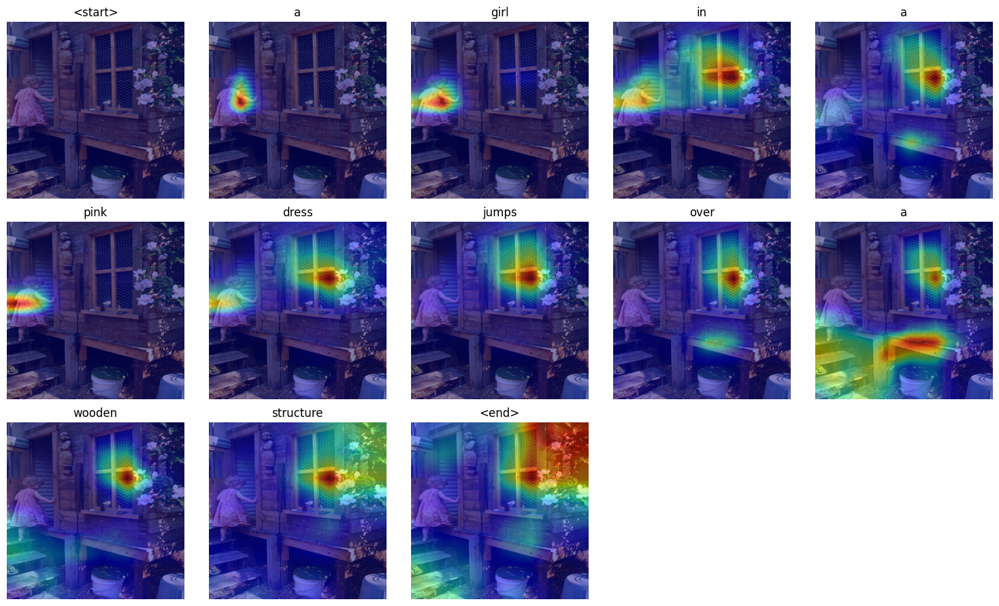

In [ ]:
from PIL import Image

def caption_image_beam_search(encoder, decoder, image_path, word_map, beam_size=3):
    """
    Reads an image and captions it with beam search.

    :param encoder: encoder model
    :param decoder: decoder model
    :param image_path: path to image
    :param word_map: word map
    :param beam_size: number of sequences to consider at each decode-step
    :return: caption, weights for visualization
    """

    k = beam_size
    vocab_size = len(word_map)

    # Read image and process
    img = Image.open(image_path).convert("RGB")
    img = img.resize((256, 256))
    img = np.array(img)

    img = img.transpose(2, 0, 1)
    img = img / 255.
    img = torch.FloatTensor(img).to(device)
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    transform = transforms.Compose([normalize])
    image = transform(img)  # (3, 256, 256)

    # Encode
    image = image.unsqueeze(0)  # (1, 3, 256, 256)
    encoder_out = encoder(image)  # (1, enc_image_size, enc_image_size, encoder_dim)
    enc_image_size = encoder_out.size(1)
    encoder_dim = encoder_out.size(3)

    # Flatten encoding
    encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
    num_pixels = encoder_out.size(1)

    # We'll treat the problem as having a batch size of k
    encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

    # Tensor to store top k previous words at each step; now they're just <start>
    k_prev_words = torch.LongTensor([[word_map['<start>']]] * k).to(device)  # (k, 1)

    # Tensor to store top k sequences; now they're just <start>
    seqs = k_prev_words  # (k, 1)

    # Tensor to store top k sequences' scores; now they're just 0
    top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

    # Tensor to store top k sequences' alphas; now they're just 1s
    seqs_alpha = torch.ones(k, 1, enc_image_size, enc_image_size).to(device)  # (k, 1, enc_image_size, enc_image_size)

    # Lists to store completed sequences, their alphas and scores
    complete_seqs = list()
    complete_seqs_alpha = list()
    complete_seqs_scores = list()

    # Start decoding
    step = 1
    h, c = decoder.init_hidden_state(encoder_out)

    # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
    while True:

        embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

        awe, alpha = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

        alpha = alpha.view(-1, enc_image_size, enc_image_size)  # (s, enc_image_size, enc_image_size)

        gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
        awe = gate * awe

        h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

        scores = decoder.fc(h)  # (s, vocab_size)
        scores = F.log_softmax(scores, dim=1)

        # Add
        scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

        # For the first step, all k points will have the same scores (since same k previous words, h, c)
        if step == 1:
            top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
        else:
            # Unroll and find top scores, and their unrolled indices
            top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

        # Convert unrolled indices to actual indices of scores
        prev_word_inds = (top_k_words // vocab_size).long()

        next_word_inds = (top_k_words % vocab_size).long()  # (s)

        # Add new words to sequences, alphas
        seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)
        seqs_alpha = torch.cat([seqs_alpha[prev_word_inds], alpha[prev_word_inds].unsqueeze(1)],
                               dim=1)  # (s, step+1, enc_image_size, enc_image_size)

        # Which sequences are incomplete (didn't reach <end>)?
        incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                           next_word != word_map['<end>']]
        complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

        # Set aside complete sequences
        if len(complete_inds) > 0:
            complete_seqs.extend(seqs[complete_inds].tolist())
            complete_seqs_alpha.extend(seqs_alpha[complete_inds].tolist())
            complete_seqs_scores.extend(top_k_scores[complete_inds])
        k -= len(complete_inds)  # reduce beam length accordingly

        # Proceed with incomplete sequences
        if k == 0:
            break
        seqs = seqs[incomplete_inds]
        seqs_alpha = seqs_alpha[incomplete_inds]
        h = h[prev_word_inds[incomplete_inds]]
        c = c[prev_word_inds[incomplete_inds]]
        encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
        top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
        k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        # Break if things have been going on too long
        if step > 50:
            break
        step += 1

    i = complete_seqs_scores.index(max(complete_seqs_scores))
    seq = complete_seqs[i]
    alphas = complete_seqs_alpha[i]

    return seq, alphas




if __name__ == '__main__':

    # ==== CẤU HÌNH ====


    word_map_path = '/content/drive/MyDrive/CV/paper/data/WORDMAP_flickr8k_5_cap_per_img_5_min_word_freq.json'
    img_path = '/content/Images/1000268201_693b08cb0e.jpg'
    model_path = '/content/drive/MyDrive/CV/paper/paper.pth.tar'


    beam_size = 5
    smooth = True

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ==== LOAD CHECKPOINT ====
    checkpoint = torch.load(model_path, map_location=device,weights_only=False)
    decoder = checkpoint['decoder']
    decoder = decoder.to(device)
    decoder.eval()
    encoder = checkpoint['encoder']
    encoder = encoder.to(device)
    encoder.eval()

    # ==== LOAD WORD MAP ====
    with open(word_map_path, 'r') as j:
        word_map = json.load(j)
    rev_word_map = {v: k for k, v in word_map.items()}

    # ==== GỌI BEAM SEARCH VÀ HIỂN THỊ ====
    seq, alphas = caption_image_beam_search(encoder, decoder, img_path, word_map, beam_size)
    alphas = torch.FloatTensor(alphas)


    # Visualize caption and attention of best sequence
    visualize_att(img_path, seq, alphas, rev_word_map, smooth)


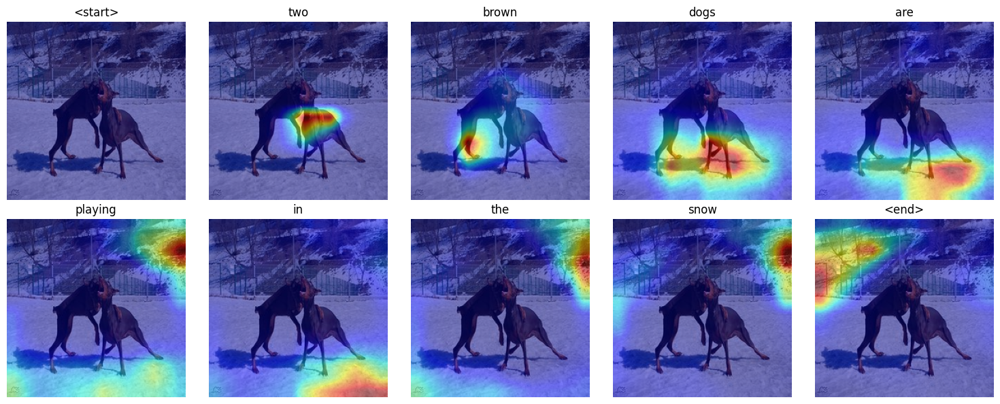

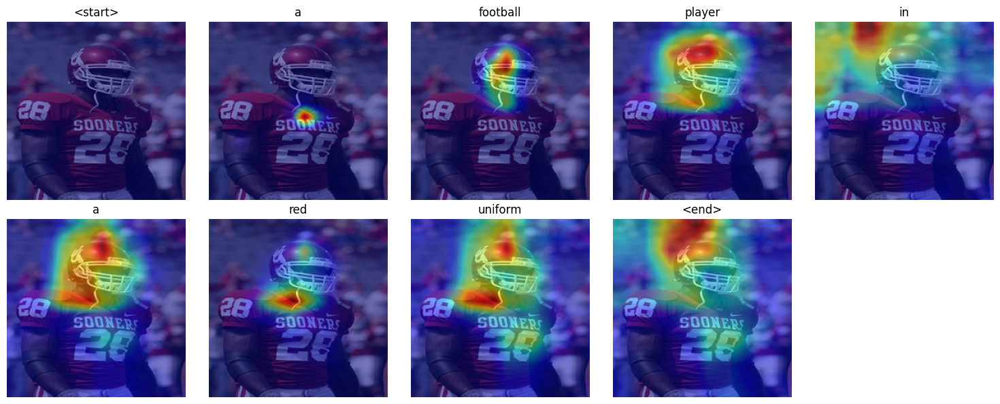

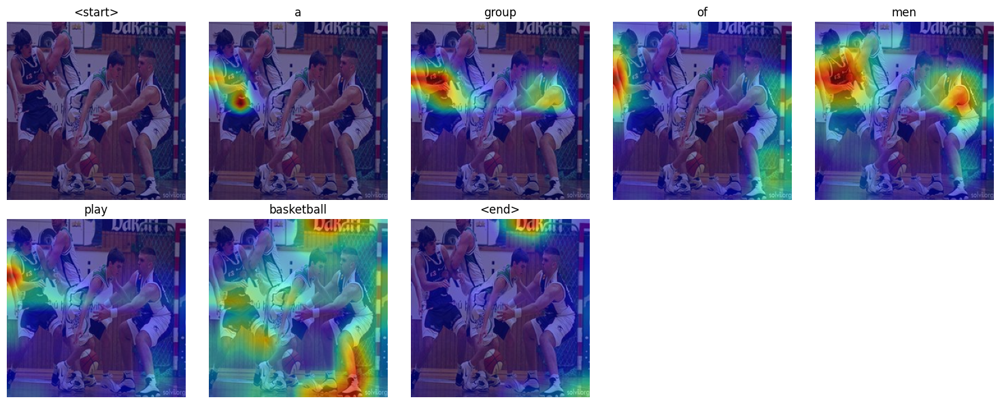

In [ ]:
data_folder = '/content/drive/MyDrive/CV/paper/data'  # folder with data files saved by create_input_files.py
data_name = 'flickr8k_5_cap_per_img_5_min_word_freq'  # base name shared by data files
from torch.utils.data import Subset

# Chỉ định index ảnh muốn lấy (mỗi ảnh có 5 dòng)
indices = [0 * 5, 4 * 5, 9 * 5]  # tương ứng ảnh 1, 5, 10

# Dataset gốc
dataset = CaptionDataset(data_folder, data_name, 'TEST', transform=transforms.Compose([normalize]))

# Tạo subset chỉ chứa 3 ảnh
subset = Subset(dataset, indices)

# Tạo DataLoader cho 3 ảnh này
loader = torch.utils.data.DataLoader(subset, batch_size=1, num_workers=0, pin_memory=True)

# Lặp qua 3 ảnh khác nhau
for i, (image, caps, caplens, allcaps) in enumerate(loader):
    # Xử lý và caption như trước
    img = image.to(device)

    # Chuyển về numpy để hiển thị
    img_np = img.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    img_np = img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
    img_np = np.clip(img_np, 0, 1)
    img_pil = Image.fromarray((img_np * 255).astype(np.uint8))
    img_temp_path = f"temp_image_{i}.jpg"
    img_pil.save(img_temp_path)

    # Caption
    seq, alphas = caption_image_beam_search(encoder, decoder, img_temp_path, word_map, beam_size)
    alphas = torch.FloatTensor(alphas)
    visualize_att(img_temp_path, seq, alphas, rev_word_map, smooth=True)


#Code transfomer

##Library

In [ ]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import math

from torchvision import models

# === CNN Feature Extractor using ResNet18 ===
import torch.nn as nn
from torchvision import models
import torch
from torch.utils.data import Dataset
import h5py
import json
import os
import json
from collections import Counter
import os
import json
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt

##Dataset

In [ ]:
from torch.utils.data import Dataset
import torch
import torchvision.transforms as transforms
from PIL import Image
import pandas as pd
import os

class CaptionDataset(Dataset):
    def __init__(self, annot_df, img_root, word_to_idx, max_len=30, data='train'):
        """
        annot_df: pd.DataFrame gồm các cột ['image_id', 'caption']
        img_root: thư mục chứa ảnh jpg
        word_to_idx: từ điển ánh xạ từ từ -> id
        """
        self.annot_df = annot_df.reset_index(drop=True)
        self.img_root = img_root
        self.word_to_idx = word_to_idx
        self.max_len = max_len
        self.data = data

        if data == 'train':
            self.transform = transforms.Compose([
            transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225]),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]),
            ])

    def encode_caption(self, caption):
      """
      Encode caption thành chuỗi ID: [<sos>, ...tokens..., <eos>, <pad>...]
      đảm bảo luôn chứa <eos>
      """
      tokens = caption.lower().strip().split()
      unk_idx = self.word_to_idx.get('<unk>')

      # Giới hạn số token để còn chỗ cho <sos> và <eos>
      tokens = tokens[:self.max_len - 2]

      ids = [self.word_to_idx.get('<sos>')] + \
            [self.word_to_idx.get(w, unk_idx) for w in tokens] + \
            [self.word_to_idx.get('<eos>')]

      # Pad nếu chưa đủ
      if len(ids) < self.max_len:
          ids += [self.word_to_idx.get('<pad>')] * (self.max_len - len(ids))

      return torch.tensor(ids, dtype=torch.long)


    def __getitem__(self, idx):
        row = self.annot_df.iloc[idx]
        img_path = os.path.join(self.img_root, row['image'])  # Ex: '1001773457_577c3a7d70.jpg'
        caption = row['caption']

        # Load ảnh và transform
        image = Image.open(img_path).convert('RGB')
        image_tensor = self.transform(image)

        # Encode caption
        caption_tensor = self.encode_caption(caption)

        return image_tensor, caption_tensor

    def __len__(self):
        return len(self.annot_df)

##Vocabulary

In [9]:
class Vocabulary:
    def __init__(self, freq_threshold=5):
        self.freq_threshold = freq_threshold
        self.itos = {0: "<pad>", 1: "<sos>", 2: "<eos>", 3: "<unk>"}
        self.stoi = {v: k for k, v in self.itos.items()}

    def build_vocabulary(self, sentence_list):
        counter = Counter()
        for sentence in sentence_list:
            tokens = sentence.lower().split()
            counter.update(tokens)

        idx = len(self.itos)
        for word, freq in counter.items():
            if freq >= self.freq_threshold:
                self.stoi[word] = idx
                self.itos[idx] = word
                idx += 1

    def numericalize(self, text):
        tokenized = text.lower().split()
        return [self.stoi.get(word, self.stoi["<unk>"]) for word in tokenized]

    def save(self, path):
        with open(path, "w") as f:
            json.dump({"itos": self.itos, "stoi": self.stoi}, f)

    def decode(self, ids):
        words = []
        for idx in ids:
            word = self.itos.get(idx, "<unk>")
            if word == "<eos>":
                break
            if word not in ["<pad>", "<sos>"]:
                words.append(word)
        return " ".join(words)


    @classmethod
    def load(cls, path):
        with open(path, "r") as f:
            data = json.load(f)
        vocab = cls()
        vocab.itos = {int(k): v for k, v in data["itos"].items()}
        vocab.stoi = data["stoi"]
        return vocab


##Model

In [13]:
class ResNetEncoder(nn.Module):
    def __init__(self, d_model=512):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)

        # Chia block như ResNet18
        self.layer0 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool)
        self.layer1 = resnet.layer1
        self.layer2 = resnet.layer2
        self.layer3 = resnet.layer3
        self.layer4 = resnet.layer4  # Output [B, 512, H/32, W/32] với ResNet18

        # Projection từ 512 → d_model
        self.proj = nn.Conv2d(2048, d_model, kernel_size=1)

        # Freeze mọi thứ trừ layer4 + proj
        self.freeze_except_layer4()

    def freeze_except_layer4(self):
        for param in self.parameters():
            param.requires_grad = False
        for param in self.layer4.parameters():
            param.requires_grad = True
        for param in self.proj.parameters():
            param.requires_grad = True

    def forward(self, x):
        if x.size(1) == 1:
            x = x.repeat(1, 3, 1, 1)
        x = self.layer0(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)           # [B, 512, H/32, W/32]
        x = self.proj(x)             # [B, d_model, H/32, W/32]
        B, C, H, W = x.shape
        x = x.view(B, C, H * W).permute(0, 2, 1)  # [B, Seq, d_model]
        return x



# === Positional Encoding ===
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position.float() * div_term)
        pe[:, 1::2] = torch.cos(position.float() * div_term)
        pe = pe.unsqueeze(0)  # [1, max_len, d_model]
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)].to(x.device)
        return x


class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, d_model=512, nhead=8, num_layers=3, pad_idx=0, dropout=0.5):
        super().__init__()
        self.pad_idx = pad_idx
        self.embedding = nn.Embedding(vocab_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)
        self.dropout = nn.Dropout(dropout)

        decoder_layer = nn.TransformerDecoderLayer(d_model, nhead, dropout=dropout)
        self.decoder = nn.TransformerDecoder(decoder_layer, num_layers)

        self.fc_dropout = nn.Dropout(dropout)
        self.fc_out = nn.Linear(d_model, vocab_size)

    def forward(self, memory, tgt_input):
        B, T = tgt_input.size()

        # 1) Embedding + positional + dropout
        tgt_embed = self.embedding(tgt_input) * math.sqrt(memory.size(-1))  # [B, T, D]
        tgt_embed = self.dropout(self.pos_encoder(tgt_embed))

        tgt = tgt_embed.permute(1, 0, 2)  # [T, B, D]
        mem = memory.permute(1, 0, 2)     # [S, B, D]

        # 2) Causal + padding mask
        raw_mask = nn.Transformer.generate_square_subsequent_mask(T, device=tgt.device)
        tgt_mask = raw_mask.to(torch.bool)
        tgt_key_padding_mask = (tgt_input == self.pad_idx)

        # 3) Decode
        dec_out = self.decoder(tgt, mem,
                               tgt_mask=tgt_mask,
                               tgt_key_padding_mask=tgt_key_padding_mask)  # [T, B, D]

        # 4) Output
        out = self.fc_out(self.fc_dropout(dec_out.permute(1, 0, 2)))  # [B, T, vocab_size]
        return out



class ImageCaptioningModel(nn.Module):
    def __init__(self, vocab_size, d_model=256, pad_idx=0):
        super().__init__()
        self.encoder = ResNetEncoder(d_model=d_model)
        self.decoder = TransformerDecoder(
            vocab_size=vocab_size, d_model=d_model, pad_idx=pad_idx
        )

    def forward(self, images, tgt_input):
        memory = self.encoder(images)             # [B, S, d_model]
        output = self.decoder(memory, tgt_input)  # [B, T, vocab_size]
        return output



##Train

In [ ]:
import torch
import torch.nn as nn
import pandas as pd
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tqdm import tqdm
import json


# ====== CẤU HÌNH ======
CSV_PATH     = "/content/captions.txt"         # file ảnh-caption
IMG_FOLDER   = "/content/Images"       # thư mục chứa ảnh gốc
VOCAB_JSON   = "vocab.json"
MAX_LEN      = 40
BATCH_SIZE   = 128
EPOCHS       = 10
LR           = 1e-4
MODEL_PATH   = "caption_model_best.pth"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ====== LOAD VOCAB ======
vocab = Vocabulary.load(VOCAB_JSON)
vocab_size = len(vocab.itos)
pad_idx    = vocab.stoi["<pad>"]
sos_idx    = vocab.stoi["<sos>"]


# ====== LOAD DATA ======
df = pd.read_csv(CSV_PATH)

print(df['caption'].apply(lambda x: len(x.split())).describe())

# --- Bước 1: Lấy danh sách ảnh duy nhất ---
unique_images = df['image'].unique()

# --- Bước 2: Chia ảnh thành train/val ---
from sklearn.model_selection import train_test_split
train_imgs, val_imgs = train_test_split(unique_images, test_size=0.2, random_state=42)

# --- Bước 3: Tạo lại DataFrame theo ảnh ---
train_df = df[df['image'].isin(train_imgs)].reset_index(drop=True)
val_df   = df[df['image'].isin(val_imgs)].reset_index(drop=True)
val_df = val_df.sample(frac=1, random_state=42).reset_index(drop=True)

# --- Bước 4: Tạo Dataset & DataLoader ---
train_set = CaptionDataset(train_df, IMG_FOLDER, vocab.stoi, MAX_LEN, data='train')
val_set   = CaptionDataset(val_df, IMG_FOLDER, vocab.stoi, MAX_LEN, data='val')


train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_set, batch_size=32)


count    40455.000000
mean        11.782598
std          3.885152
min          1.000000
25%          9.000000
50%         11.000000
75%         14.000000
max         38.000000
Name: caption, dtype: float64


Validation: 100%|██████████| 253/253 [00:57<00:00,  4.43it/s]


=> 16/32 caption kết thúc bằng <eos>
=> 15/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a man in a man in a red .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man in a man is is is

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is is is

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy is is in a red is is is

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: a man is is in a man in a red .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a man in a red is is is

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a man in a man in a red .

>>> Sample 8
 GT: A child on a scooter moving down the sidewalk .
 PR: a man is is is

>>> Sample 9
 GT: The sun is under someone 's nose .
 PR: a man is is in a red is is is

>>> Sample 10
 GT: A

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.41it/s]


=> 28/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a man is standing on a red shirt is standing on a red shirt is standing on a red shirt is standing on a red shirt and a red shirt and a red shirt and a red shirt and a

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man is standing on a red shirt is sitting on a red shirt and a red shirt is sitting .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is jumping on a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy is jumping in a red shirt is jumping in a red shirt is jumping .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: a man is jumping on a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: two people are playing in a red .

>>> Samp

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.44it/s]


=> 22/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a man in a red shirt is standing on a red shirt and a red shirt is standing on a red shirt and a red shirt and a red shirt and a red shirt and a red shirt and a

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man in a black shirt is standing on a red shirt and a red shirt and a red shirt and a woman in a red shirt and a red shirt is standing on a red shirt and a red

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is riding a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in a red shirt is playing in a red shirt is playing in a red shirt is playing in a red shirt is standing on a red shirt is standing in the

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two p

Validation: 100%|██████████| 253/253 [00:58<00:00,  4.36it/s]


=> 27/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a man in a red shirt is standing on a red shirt and a red shirt is standing on a red shirt and a red shirt and a red shirt and a red shirt and a red shirt and a

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a woman in a black shirt is sitting on a table .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is riding a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in a red shirt is playing in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: two people are playing in a red shirt is running 

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.38it/s]


=> 28/32 caption kết thúc bằng <eos>
=> 1/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a man in a red shirt is standing on a red shirt and a red shirt and a red shirt and a red shirt is standing on a red shirt and a red shirt and a red shirt and a

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man in a black shirt is sitting on a table .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is riding a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: two people are playing in a wave .

>>> Sample 7
 GT: Crowd behind man working projector
 PR

Validation: 100%|██████████| 253/253 [00:56<00:00,  4.51it/s]


=> 29/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a man in a red shirt is standing on a building .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man in a black shirt is sitting on a table .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is riding a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a little boy in a red shirt is playing in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are playing in the water .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a white shirt is standing on a crowd of a crowd of a crowd of a crowd of a crowd of 

Validation: 100%|██████████| 253/253 [00:58<00:00,  4.36it/s]


=> 28/32 caption kết thúc bằng <eos>
=> 1/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: two people are standing on a building .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a woman in a black shirt and a black shirt and a black shirt and a woman in a black shirt and a black shirt and a black shirt and a black shirt and a woman in a black shirt

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is doing a bike on a dirt bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are riding a wave .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a group of p

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.43it/s]


=> 30/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt is standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: two young girls are sitting on a table .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is doing a trick on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are sitting on a yellow surfboard .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a white shirt is standing on a crowd of a crowd of a crowd of people in front of a crowd of a crowd of a crowd o

Validation: 100%|██████████| 253/253 [00:56<00:00,  4.47it/s]


=> 32/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt is standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man is sitting on a bench .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man is doing a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a little boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are standing in a yellow kayak .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a white shirt is standing on a crowd of a crowd of a crowd of people in front of a crowd of a crowd of a crowd of people

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.41it/s]


=> 32/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: two people are standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man is sitting on a bench .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man in a blue shirt is jumping a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a dirt road .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: people are riding a raft in a raft .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a white shirt is standing on a city street .

>>> Sample 8
 GT: A child on a scooter moving down the sidewalk .
 PR: a 

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.38it/s]


=> 30/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt and white shirt are standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man in a black shirt is sitting on a bench .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man in a blue shirt is doing a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a young boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a dirt road .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are standing in a yellow kayak .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a blue shirt is standing on a crowd of people in front o

Validation: 100%|██████████| 253/253 [00:56<00:00,  4.46it/s]


=> 32/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt and a red shirt and a red shirt are standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a young man in a black shirt is sitting on a table with a table .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man in a blue shirt is doing a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a young boy in a red shirt is wearing a red jacket is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a hill .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are standing in a raft .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a blue shi

Validation: 100%|██████████| 253/253 [00:57<00:00,  4.36it/s]


=> 31/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt and a red shirt is standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man is sitting on a table with a table .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man in a blue shirt is doing a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a dirt path .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a man in a blue kayak is kayaking through a raft .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a blue shirt is standing on a brick wall .

>>> Sample 8
 GT: A chi

Validation: 100%|██████████| 253/253 [00:56<00:00,  4.49it/s]


=> 32/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt and white shirt is standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man is sitting on a bench with a table in front of a window .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man in a blue shirt is doing a bike on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a boy in a red shirt is wearing a red shirt and red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a dirt path .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are kayaking in a raft in a raft .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man and a man 

Validation: 100%|██████████| 253/253 [00:56<00:00,  4.46it/s]


=> 32/32 caption kết thúc bằng <eos>
=> 0/32 caption lặp 3 từ cuối giống nhau
>>> Sample 1
 GT: A woman makes a purchase at an outdoor vendor .
 PR: a woman in a red shirt and white shirt are standing on a sidewalk .

>>> Sample 2
 GT: A woman with her head down and her hand to her mouth sitting beside someone reading .
 PR: a man in a black shirt is sitting on a window .

>>> Sample 3
 GT: A man in beige pants does a trick on a bicycle .
 PR: a man in a blue shirt is doing a trick on a bike .

>>> Sample 4
 GT: little kid in red snowsuit with hello kitty mittens
 PR: a young boy in a red shirt is playing in the snow .

>>> Sample 5
 GT: Two bicyclists ride down a hill .
 PR: two people are riding a dirt bike on a dirt path .

>>> Sample 6
 GT: Seven rafters are paddling and riding the rapids in a green raft .
 PR: a group of people are kayaking through a river .

>>> Sample 7
 GT: Crowd behind man working projector
 PR: a man in a blue shirt and a man are standing on a bench .

>>> Sa

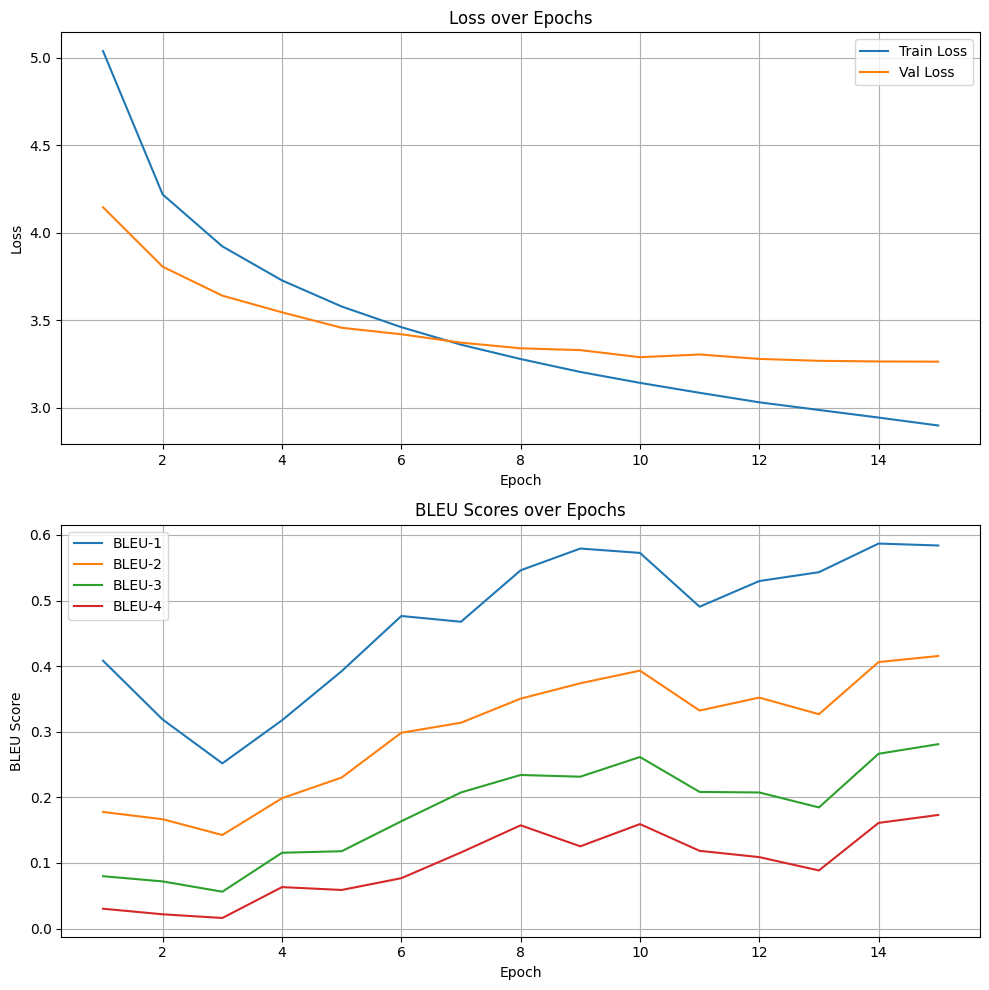

In [ ]:

from collections import defaultdict

val_refs_dict = defaultdict(list)
for _, row in val_df.iterrows():
    val_refs_dict[row['image']].append(row['caption'])


# ====== MODEL & LOSS ======
model = ImageCaptioningModel(vocab_size=vocab_size, pad_idx=pad_idx).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=pad_idx)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)


# ====== EVALUATION HÀM ======
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

def evaluate_model(model, dataloader, vocab, val_refs_dict, max_len=40, samples_to_print=5):
    model.eval()
    all_preds = []
    all_refs = []
    printed_samples = 0
    chencherry = SmoothingFunction()

    eos_idx = vocab.stoi.get("<eos>", None)
    sos_idx = vocab.stoi.get("<sos>", None)

    seen_images = set()

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            B = images.size(0)
            tgt_input = torch.full((B, 1), sos_idx, dtype=torch.long).to(device)
            preds = [[] for _ in range(B)]
            stop_flags = [False for _ in range(B)]

            for _ in range(max_len):
                out = model(images, tgt_input)
                out[:, -1, pad_idx] = float('-inf')
                next_token = out[:, -1, :].argmax(-1, keepdim=True)
                tgt_input = torch.cat([tgt_input, next_token], dim=1)

                for i in range(B):
                    if stop_flags[i]:
                        continue
                    token = next_token[i].item()
                    preds[i].append(token)
                    if token == eos_idx or (len(preds[i]) >= 4 and len(set(preds[i][-3:])) == 1):
                        stop_flags[i] = True

                if all(stop_flags):
                    break

            pred_texts = [vocab.decode(p) for p in preds]
            eos_count = sum([p[-1] == eos_idx for p in preds if len(p) > 0])
            loop_count = sum([len(p) >= 3 and len(set(p[-3:])) == 1 for p in preds])
            print(f"=> {eos_count}/{len(preds)} caption kết thúc bằng <eos>")
            print(f"=> {loop_count}/{len(preds)} caption lặp 3 từ cuối giống nhau")


            # Lấy image_ids tương ứng từ DataFrame gốc
            batch_indices = dataloader.dataset.annot_df.index[tgt_input.size(0) * printed_samples : tgt_input.size(0) * (printed_samples + 1)]
            image_ids = dataloader.dataset.annot_df.loc[batch_indices, 'image'].tolist()

            for i in range(B):
                img_id = image_ids[i]
                if img_id in seen_images:
                    continue
                seen_images.add(img_id)

                pr = pred_texts[i]
                refs = val_refs_dict[img_id]  # list of 5 ref

                all_preds.append(pr.split())
                all_refs.append([r.split() for r in refs])

                if printed_samples < samples_to_print:
                    print(f">>> Sample {printed_samples+1}")
                    print(f" GT: {refs[0]}")
                    print(f" PR: {pr}\n")
                    printed_samples += 1

                if printed_samples >= 10:
                    break

            if printed_samples >= 10:
                break

    # BLEU
    bleu1 = corpus_bleu(all_refs, all_preds, weights=(1.0, 0, 0, 0), smoothing_function=chencherry.method1)
    bleu2 = corpus_bleu(all_refs, all_preds, weights=(0.5, 0.5, 0, 0), smoothing_function=chencherry.method1)
    bleu3 = corpus_bleu(all_refs, all_preds, weights=(0.33, 0.33, 0.33, 0), smoothing_function=chencherry.method1)
    bleu4 = corpus_bleu(all_refs, all_preds, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=chencherry.method1)

    return {
        "BLEU-1": bleu1,
        "BLEU-2": bleu2,
        "BLEU-3": bleu3,
        "BLEU-4": bleu4,
    }




from collections import defaultdict

val_refs_dict = defaultdict(list)
for _, row in val_df.iterrows():
    val_refs_dict[row['image']].append(row['caption'])

# ====== TRAINING LOOP ======
train_losses, val_losses = [], []
best_val_loss = float('inf')
bleu1_scores, bleu2_scores, bleu3_scores, bleu4_scores = [], [], [], []

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}")
    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        output = model(images, labels[:, :-1])  # teacher forcing
        loss = criterion(output.reshape(-1, vocab_size), labels[:, 1:].reshape(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation loss
    model.eval()
    total_val_loss = 0.0
    loop_val = tqdm(val_loader, desc=f"Validation")
    with torch.no_grad():
        for images, labels in loop_val:
            images, labels = images.to(device), labels.to(device)
            output = model(images, labels[:, :-1])
            loss = criterion(output.reshape(-1, vocab_size), labels[:, 1:].reshape(-1))
            total_val_loss += loss.item()
    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    bleu_scores = evaluate_model(model, val_loader, vocab,val_refs_dict, samples_to_print=10)
    bleu1_scores.append(bleu_scores["BLEU-1"])
    bleu2_scores.append(bleu_scores["BLEU-2"])
    bleu3_scores.append(bleu_scores["BLEU-3"])
    bleu4_scores.append(bleu_scores["BLEU-4"])

    print(f"[Epoch {epoch+1}] Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")
    print(f"BLEU-1: {bleu_scores['BLEU-1']:.4f} | BLEU-2: {bleu_scores['BLEU-2']:.4f} | BLEU-3: {bleu_scores['BLEU-3']:.4f} | BLEU-4: {bleu_scores['BLEU-4']:.4f}")

    # Save best
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), MODEL_PATH)
        print(">> Saved new best model!")

# ====== LOSS PLOT ======
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Subplot 1: Loss
axs[0].plot(range(1, EPOCHS+1), train_losses, label="Train Loss")
axs[0].plot(range(1, EPOCHS+1), val_losses, label="Val Loss")
axs[0].set_title("Loss over Epochs")
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss")
axs[0].legend()
axs[0].grid(True)

# Subplot 2: BLEU
axs[1].plot(range(1, EPOCHS+1), bleu1_scores, label="BLEU-1")
axs[1].plot(range(1, EPOCHS+1), bleu2_scores, label="BLEU-2")
axs[1].plot(range(1, EPOCHS+1), bleu3_scores, label="BLEU-3")
axs[1].plot(range(1, EPOCHS+1), bleu4_scores, label="BLEU-4")
axs[1].set_title("BLEU Scores over Epochs")
axs[1].set_xlabel("Epoch")
axs[1].set_ylabel("BLEU Score")
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
from torch.utils.data import DataLoader

# Dataset đầy đủ
dataset = CaptionDataset(data_folder, data_name, 'TEST', transform=transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
]))

# DataLoader toàn bộ ảnh test
loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=0, pin_memory=True)

# Tạo dict chứa reference captions cho từng ảnh
val_refs_dict = {}
for i, (_, _, _, allcaps) in enumerate(loader):
    img_id = f"custom_img_{i}"  # đặt tên giả định nếu không có image_id
    caps = allcaps[0].tolist()  # allcaps shape: (1, 5, max_len) → lấy allcaps[0]
    decoded_refs = [
        vocab.decode([w for w in cap if w not in {vocab.stoi['<sos>'], vocab.stoi['<pad>'], vocab.stoi['<eos>']}]).lower()
        for cap in caps
    ]
    val_refs_dict[img_id] = decoded_refs

print(f"Loaded {len(val_refs_dict)} images for evaluation.")


Loaded 5000 images for evaluation.


In [ ]:
import json
from torch.utils.data import DataLoader
from torchvision import transforms
from collections import defaultdict

# === 1. Load word_map và vocab ===
with open('/content/drive/MyDrive/CV/paper/data/WORDMAP_flickr8k_5_cap_per_img_5_min_word_freq.json', 'r') as j:
    word_map = json.load(j)

vocab = Vocabulary.load('/content/drive/MyDrive/CV/transformer/vocab.json')

# === 2. Chuẩn hóa token đặc biệt giữa word_map và vocab ===
special_token_map = {
    "<start>": "<sos>",
    "<end>": "<eos>",
    "<pad>": "<pad>",
    "<unk>": "<unk>"
}

rev_word_map = {v: k for k, v in word_map.items()}
for old, new in special_token_map.items():
    if old in word_map:
        rev_word_map[word_map[old]] = new

# === 3. Mapping index từ word_map → vocab ===
wordmap_idx_to_vocab_idx = {
    idx: vocab.stoi.get(rev_word_map[idx], vocab.stoi['<unk>']) for idx in rev_word_map
}

# === 4. Hàm chuyển caption dùng word_map → vocab ===
def convert_caption_indices(caption_ids, mapping_dict):
    return [
        [mapping_dict.get(token_id, vocab.stoi['<unk>']) for token_id in cap]
        for cap in caption_ids
    ]

# === 5. Load dataset test ===
dataset = CaptionDataset(
    data_folder='/content/drive/MyDrive/CV/paper/data',
    data_name='flickr8k_5_cap_per_img_5_min_word_freq',
    split='TEST',
    transform=transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
)

loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=0, pin_memory=True)

# === 6. Tạo dict chứa reference captions (decode bằng vocab) ===
val_refs_dict = {}

for i, (_, _, _, allcaps) in enumerate(loader):
    img_id = f"custom_img_{i}"
    caps = allcaps[0].tolist()  # [5, max_len]

    caps_vocab_idx = convert_caption_indices(caps, wordmap_idx_to_vocab_idx)

    decoded_refs = [
        vocab.decode([w for w in cap if w not in {
            vocab.stoi['<sos>'], vocab.stoi['<pad>'], vocab.stoi['<eos>']}]).lower()
        for cap in caps_vocab_idx
    ]

    val_refs_dict[img_id] = decoded_refs

print(f"✔️ Loaded {len(val_refs_dict)} GT captions using vocab.")
print(val_refs_dict)

✔️ Loaded 5000 GT captions using vocab.
{'custom_img_0': ['two brown dogs playfully fight in the snow', 'two brown dogs wrestle in the snow', 'two dogs playing in the snow', 'the dogs are in the snow in front of a fence', 'the dogs play on the snow'], 'custom_img_1': ['two brown dogs playfully fight in the snow', 'two brown dogs wrestle in the snow', 'two dogs playing in the snow', 'the dogs are in the snow in front of a fence', 'the dogs play on the snow'], 'custom_img_2': ['two brown dogs playfully fight in the snow', 'two brown dogs wrestle in the snow', 'two dogs playing in the snow', 'the dogs are in the snow in front of a fence', 'the dogs play on the snow'], 'custom_img_3': ['two brown dogs playfully fight in the snow', 'two brown dogs wrestle in the snow', 'two dogs playing in the snow', 'the dogs are in the snow in front of a fence', 'the dogs play on the snow'], 'custom_img_4': ['two brown dogs playfully fight in the snow', 'two brown dogs wrestle in the snow', 'two dogs play

##Eval

In [ ]:
# Parameters
checkpoint = '/content/drive/MyDrive/CV/transformer/caption_model_best_new.pth'  # model checkpoint
VOCAB_PATH = '/content/drive/MyDrive/CV/transformer/vocab.json'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # sets device for model and PyTorch tensors
cudnn.benchmark = True  # set to true only if inputs to model are fixed size; otherwise lot of computational overhead



# Load vocab
vocab = Vocabulary.load(VOCAB_PATH)

vocab_size = len(vocab.itos)
pad_idx = vocab.stoi["<pad>"]


def evaluate_model_beamsearch(model, dataloader, vocab, val_refs_dict, beam_size=3, max_len=40, samples_to_print=5):
    model.eval()
    all_preds = []
    all_refs = []
    printed_samples = 0
    chencherry = SmoothingFunction()

    eos_idx = vocab.stoi.get("<eos>", None)
    sos_idx = vocab.stoi.get("<sos>", None)
    pad_idx = vocab.stoi.get("<pad>", None)
    seen_images = set()

    with torch.no_grad():
        for images,_,_,all_caps in tqdm(dataloader, desc=f"Evaluating @ Beam size = {beam_size}"):
            images = images.to(device)
            B = images.size(0)

            assert B == 1, "Beam search version only supports batch size = 1 for simplicity."

            encoder_out = model.encoder(images)  # (1, feat_dim, H, W) → assume flattened
            encoder_out = encoder_out.expand(beam_size, -1, -1)

            k = beam_size
            seqs = torch.full((k, 1), sos_idx, dtype=torch.long).to(device)
            top_k_scores = torch.zeros(k, 1).to(device)
            complete_seqs, complete_scores = [], []

            step = 1
            while True:
                out = model.decoder(encoder_out, seqs)
                out = F.log_softmax(out, dim=-1)
                scores = out[:, -1, :]  # (k, vocab_size)
                scores[:, pad_idx] = float('-inf')  # Avoid pad token

                scores = top_k_scores.expand_as(scores) + scores  # accumulate

                if step == 1:
                    top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)
                else:
                    top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)

                prev_word_inds = top_k_words // len(vocab.stoi)
                next_word_inds = top_k_words % len(vocab.stoi)

                seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)

                incomplete_inds = [i for i, w in enumerate(next_word_inds) if w != eos_idx]
                complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

                if len(complete_inds) > 0:
                    complete_seqs.extend(seqs[complete_inds].tolist())
                    complete_scores.extend(top_k_scores[complete_inds])

                k -= len(complete_inds)
                if k == 0 or step > max_len:
                    break

                seqs = seqs[incomplete_inds]
                encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
                top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
                step += 1

            best_seq = complete_seqs[complete_scores.index(max(complete_scores))] if complete_seqs else seqs[0].tolist()
            pred_text = vocab.decode([t for t in best_seq if t not in {sos_idx, eos_idx, pad_idx}])

            # Mapping ảnh
            batch_index = printed_samples  # do mỗi lần chỉ có 1 ảnh
            img_id = f"custom_img_{printed_samples}"

            if img_id in seen_images:
                continue
            seen_images.add(img_id)

            refs = val_refs_dict[img_id]  # list of 5 captions
            all_preds.append(pred_text.split())
            all_refs.append([r.split() for r in refs])



    bleu1 = corpus_bleu(all_refs, all_preds, weights=(1.0, 0, 0, 0), smoothing_function=chencherry.method1)
    bleu2 = corpus_bleu(all_refs, all_preds, weights=(0.5, 0.5, 0, 0), smoothing_function=chencherry.method1)
    bleu3 = corpus_bleu(all_refs, all_preds, weights=(0.33, 0.33, 0.33, 0), smoothing_function=chencherry.method1)
    bleu4 = corpus_bleu(all_refs, all_preds, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=chencherry.method1)

    return bleu1, bleu2, bleu3, bleu4




if __name__ == "__main__":
    beam_size = 3
    word_map = vocab.stoi
    model = ImageCaptioningModel(vocab_size=len(word_map), d_model=256, pad_idx=word_map['<pad>'])
    model.load_state_dict(torch.load(checkpoint, map_location=device,weights_only=False))
    model = model.to(device)

    bleu1_trans, bleu2_trans, bleu3_trans, bleu4_trans = evaluate_model_beamsearch(model,loader,vocab,val_refs_dict, beam_size=beam_size)

    print(f"\nBLEU Scores @ Beam Size = {beam_size}:")
    print(f"BLEU-1: {bleu1_trans:.4f}")
    print(f"BLEU-2: {bleu2_trans:.4f}")
    print(f"BLEU-3: {bleu3_trans:.4f}")
    print(f"BLEU-4: {bleu4_trans:.4f}")




Evaluating @ Beam size = 3: 100%|██████████| 5000/5000 [06:46<00:00, 12.31it/s]


BLEU Scores @ Beam Size = 3:
BLEU-1: 0.8571
BLEU-2: 0.7559
BLEU-3: 0.4888
BLEU-4: 0.2312


##Generate

In [ ]:
data_folder = '/content/drive/MyDrive/CV/paper/data'  # folder with data files saved by create_input_files.py
data_name = 'flickr8k_5_cap_per_img_5_min_word_freq'  # base name shared by data files
from torch.utils.data import Subset

# Chỉ định index ảnh muốn lấy (mỗi ảnh có 5 dòng)
indices = [0 * 5, 4 * 5, 9 * 5]  # tương ứng ảnh 1, 5, 10
transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]),
            ])
# Dataset gốc
dataset = CaptionDataset(data_folder, data_name, 'TEST', transform=transform)

# Tạo subset chỉ chứa 3 ảnh
subset = Subset(dataset, indices)

# Tạo DataLoader cho 3 ảnh này
loader = torch.utils.data.DataLoader(subset, batch_size=1, num_workers=0, pin_memory=True)

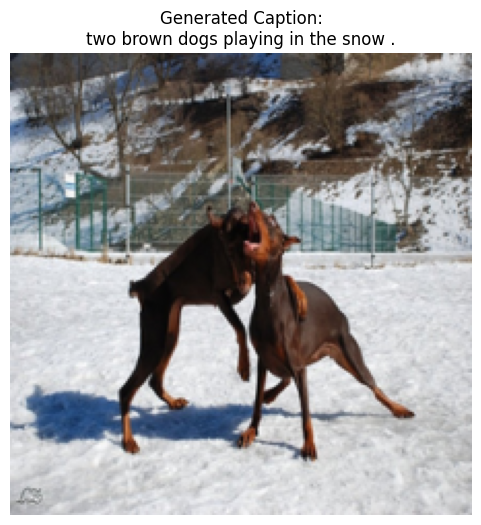

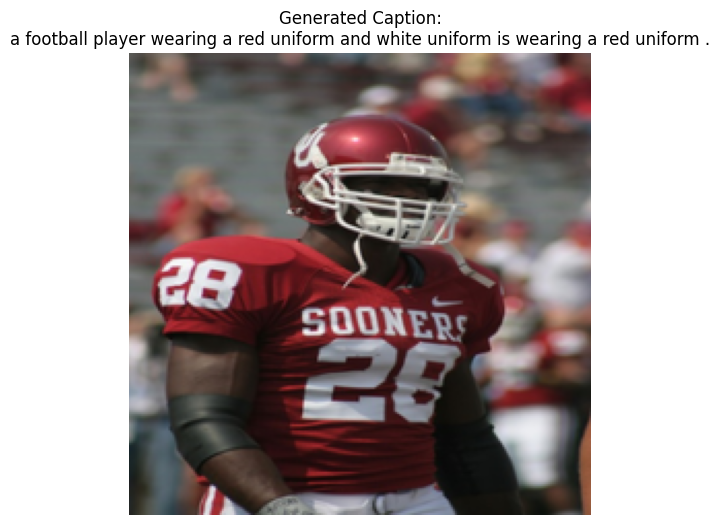

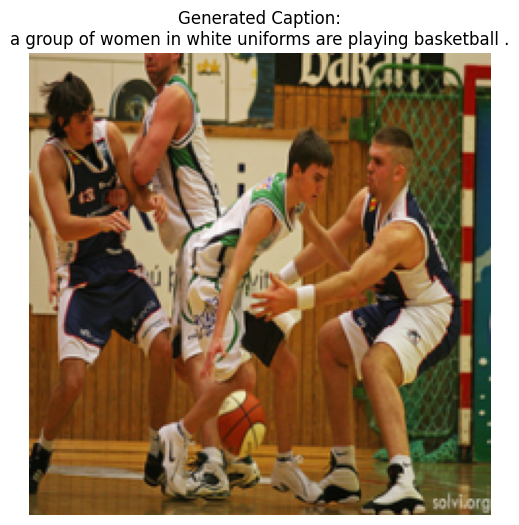

In [ ]:
def generate_caption(model, image_tensor, word_map, beam_size=5, max_len=50):
    model.eval()
    vocab_size = len(word_map)
    pad_idx = word_map['<pad>']
    sos_idx = word_map['<sos>']
    eos_idx = word_map['<eos>']

    with torch.no_grad():
        image_tensor = image_tensor.to(device)  # (1, 3, H, W)
        encoder_out = model.encoder(image_tensor)  # (1, S, D)
        encoder_out = encoder_out.expand(beam_size, -1, -1)

        seqs = torch.LongTensor([[sos_idx]] * beam_size).to(device)
        top_k_scores = torch.zeros(beam_size, 1).to(device)

        complete_seqs = []
        complete_scores = []

        step = 1
        while True:
            tgt_input = seqs
            out = model.decoder(encoder_out, tgt_input)
            out = F.log_softmax(out, dim=-1)
            scores = out[:, -1, :]  # (beam, vocab_size)
            scores = top_k_scores.expand_as(scores) + scores

            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(beam_size, 0, True, True)
            else:
                top_k_scores, top_k_words = scores.view(-1).topk(beam_size, 0, True, True)

            prev_word_inds = top_k_words // vocab_size
            next_word_inds = top_k_words % vocab_size

            seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)

            incomplete_inds = [i for i, w in enumerate(next_word_inds) if w != eos_idx]
            complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

            if len(complete_inds) > 0:
                complete_seqs.extend(seqs[complete_inds].tolist())
                complete_scores.extend(top_k_scores[complete_inds])

            beam_size -= len(complete_inds)
            if beam_size == 0 or step > max_len:
                break

            seqs = seqs[incomplete_inds]
            encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
            top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
            step += 1

        if len(complete_scores) == 0:
            seq = seqs[0].tolist()
        else:
            best_idx = complete_scores.index(max(complete_scores))
            seq = complete_seqs[best_idx]

        return seq
word_map=vocab.stoi
rev_word_map = {v: k for k, v in word_map.items()}

for i, (image_tensor, _, _, _) in enumerate(loader):
    # Lưu ảnh raw để hiển thị
    image_np = image_tensor.squeeze(0).numpy().transpose(1, 2, 0)
    image_np = image_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
    image_np = np.clip(image_np, 0, 1)

    # Sinh caption
    seq = generate_caption(model, image_tensor, word_map, beam_size=5)

    # Chuyển id -> word
    caption_words = [rev_word_map[idx] for idx in seq if idx not in {
        word_map['<sos>'], word_map['<eos>'], word_map['<pad>']}]
    caption = ' '.join(caption_words)

    # Hiển thị ảnh + caption
    plt.figure(figsize=(6, 6))
    plt.imshow(image_np)
    plt.axis('off')
    plt.title(f"Generated Caption:\n{caption}", fontsize=12)
    plt.show()


#Benchmark

In [ ]:
def plot_bleu_scores(bleu_trans, bleu_paper, beam_size):
    labels = ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']
    x = np.arange(len(labels))  # vị trí các cột
    width = 0.35  # độ rộng cột

    fig, ax = plt.subplots(figsize=(8, 5))
    rects1 = ax.bar(x - width/2, bleu_trans, width, label='Transformer decoder')
    rects2 = ax.bar(x + width/2, bleu_paper, width, label='LSTM+Attention(paper)')

    # Thêm chi tiết
    ax.set_ylabel('BLEU Score')
    ax.set_title(f'BLEU Scores Comparison (Beam Size = {beam_size})')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.set_ylim(0, 1)
    ax.legend()

    # In giá trị trên đầu cột
    for rects in [rects1, rects2]:
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.4f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),
                        textcoords="offset points",
                        ha='center', va='bottom')

    plt.tight_layout()
    plt.show()


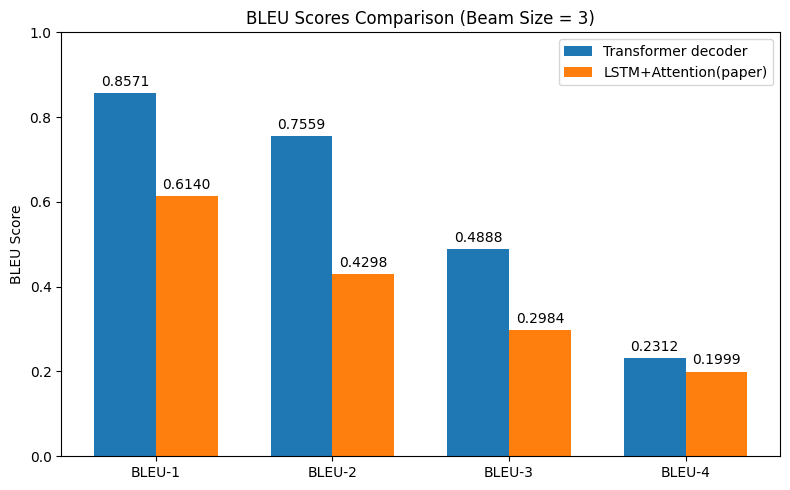

In [ ]:
if __name__ == '__main__':

    # Plot
    plot_bleu_scores(
        [bleu1_trans, bleu2_trans, bleu3_trans, bleu4_trans],
        [bleu1_paper, bleu2_paper, bleu3_paper, bleu4_paper],
        beam_size=beam_size
    )


#Live testing

## CNN+LSTM

Saving anhtest.jpg to anhtest (3).jpg


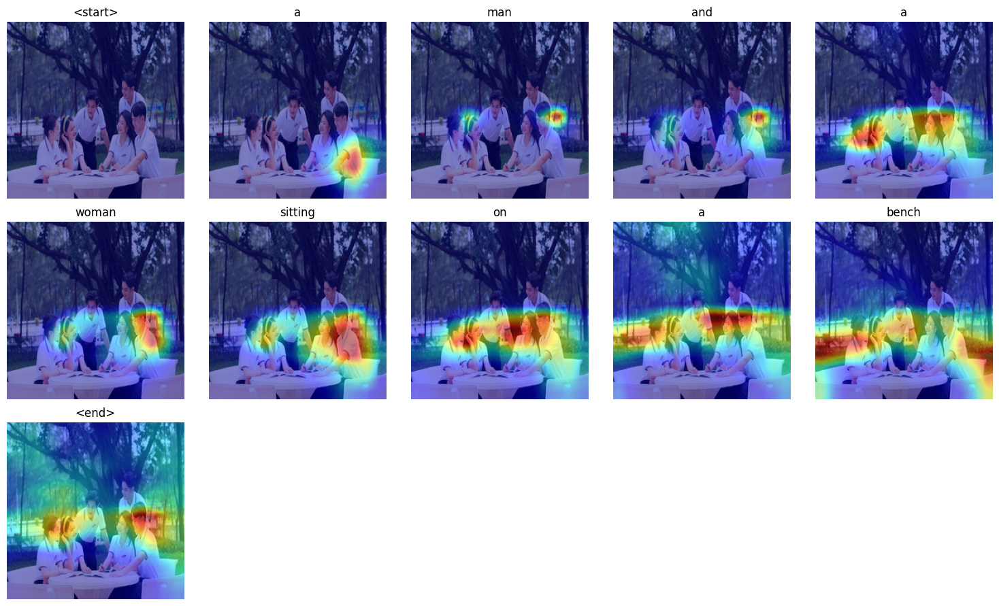

In [56]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab import files

def visualize_att(img_path, seq, alphas, rev_word_map, smooth=True):
    image = Image.open(img_path).convert("RGB")
    image = image.resize([224, 224], Image.LANCZOS)
    words = [rev_word_map[ind] for ind in seq]

    n_cols = 5
    n_rows = int(np.ceil(len(words) / n_cols))

    plt.figure(figsize=(n_cols * 3, n_rows * 3))

    for t in range(len(words)):
        ax = plt.subplot(n_rows, n_cols, t + 1)

        # Resize alpha map
        alpha = alphas[t].numpy()
        alpha = cv2.resize(alpha, (224, 224))

        if smooth:
            alpha = cv2.GaussianBlur(alpha, (7, 7), 0)

        alpha = (alpha - alpha.min()) / (alpha.max() - alpha.min() + 1e-8)

        # Overlay attention map
        overlay = np.array(image).astype(np.float32) / 255.
        cmap = plt.get_cmap('jet')
        alpha_map = cmap(alpha)[:, :, :3]  # remove alpha channel

        heatmap = 0.5 * overlay + 0.5 * alpha_map
        heatmap = np.clip(heatmap, 0, 1)

        ax.imshow(heatmap)
        ax.set_title(words[t])
        ax.axis('off')

    plt.tight_layout()
    plt.show()


def caption_image_beam_search(encoder, decoder, image_path, word_map, beam_size=3):
    """
    Reads an image and captions it with beam search.

    :param encoder: encoder model
    :param decoder: decoder model
    :param image_path: path to image
    :param word_map: word map
    :param beam_size: number of sequences to consider at each decode-step
    :return: caption, weights for visualization
    """

    k = beam_size
    vocab_size = len(word_map)

    # Read image and process
    img = Image.open(image_path).convert("RGB")
    img = img.resize((256, 256))
    img = np.array(img)

    img = img.transpose(2, 0, 1)
    img = img / 255.
    img = torch.FloatTensor(img).to(device)
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    transform = transforms.Compose([normalize])
    image = transform(img)  # (3, 256, 256)

    # Encode
    image = image.unsqueeze(0)  # (1, 3, 256, 256)
    encoder_out = encoder(image)  # (1, enc_image_size, enc_image_size, encoder_dim)
    enc_image_size = encoder_out.size(1)
    encoder_dim = encoder_out.size(3)

    # Flatten encoding
    encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
    num_pixels = encoder_out.size(1)

    # We'll treat the problem as having a batch size of k
    encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

    # Tensor to store top k previous words at each step; now they're just <start>
    k_prev_words = torch.LongTensor([[word_map['<start>']]] * k).to(device)  # (k, 1)

    # Tensor to store top k sequences; now they're just <start>
    seqs = k_prev_words  # (k, 1)

    # Tensor to store top k sequences' scores; now they're just 0
    top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

    # Tensor to store top k sequences' alphas; now they're just 1s
    seqs_alpha = torch.ones(k, 1, enc_image_size, enc_image_size).to(device)  # (k, 1, enc_image_size, enc_image_size)

    # Lists to store completed sequences, their alphas and scores
    complete_seqs = list()
    complete_seqs_alpha = list()
    complete_seqs_scores = list()

    # Start decoding
    step = 1
    h, c = decoder.init_hidden_state(encoder_out)

    # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
    while True:

        embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

        awe, alpha = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

        alpha = alpha.view(-1, enc_image_size, enc_image_size)  # (s, enc_image_size, enc_image_size)

        gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
        awe = gate * awe

        h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

        scores = decoder.fc(h)  # (s, vocab_size)
        scores = F.log_softmax(scores, dim=1)

        # Add
        scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

        # For the first step, all k points will have the same scores (since same k previous words, h, c)
        if step == 1:
            top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
        else:
            # Unroll and find top scores, and their unrolled indices
            top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

        # Convert unrolled indices to actual indices of scores
        prev_word_inds = (top_k_words // vocab_size).long()

        next_word_inds = (top_k_words % vocab_size).long()  # (s)

        # Add new words to sequences, alphas
        seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)
        seqs_alpha = torch.cat([seqs_alpha[prev_word_inds], alpha[prev_word_inds].unsqueeze(1)],
                               dim=1)  # (s, step+1, enc_image_size, enc_image_size)

        # Which sequences are incomplete (didn't reach <end>)?
        incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                           next_word != word_map['<end>']]
        complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

        # Set aside complete sequences
        if len(complete_inds) > 0:
            complete_seqs.extend(seqs[complete_inds].tolist())
            complete_seqs_alpha.extend(seqs_alpha[complete_inds].tolist())
            complete_seqs_scores.extend(top_k_scores[complete_inds])
        k -= len(complete_inds)  # reduce beam length accordingly

        # Proceed with incomplete sequences
        if k == 0:
            break
        seqs = seqs[incomplete_inds]
        seqs_alpha = seqs_alpha[incomplete_inds]
        h = h[prev_word_inds[incomplete_inds]]
        c = c[prev_word_inds[incomplete_inds]]
        encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
        top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
        k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        # Break if things have been going on too long
        if step > 50:
            break
        step += 1

    i = complete_seqs_scores.index(max(complete_seqs_scores))
    seq = complete_seqs[i]
    alphas = complete_seqs_alpha[i]

    return seq, alphas

if __name__ == '__main__':

    # ==== CẤU HÌNH ====
    word_map_path = '/content/WORDMAP.json'
    model_path = '/content/paper.pth.tar'

    # Hiển thị hộp thoại chọn ảnh từ máy
    uploaded = files.upload()
    # Lấy tên file ảnh đầu tiên vừa upload
    img_path = list(uploaded.keys())[0]

    beam_size = 5
    smooth = True

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ==== LOAD CHECKPOINT ====
    checkpoint = torch.load(model_path, map_location=device,weights_only=False)
    decoder = checkpoint['decoder']
    decoder = decoder.to(device)
    decoder.eval()
    encoder = checkpoint['encoder']
    encoder = encoder.to(device)
    encoder.eval()

    # ==== LOAD WORD MAP ====
    with open(word_map_path, 'r') as j:
        word_map = json.load(j)
    rev_word_map = {v: k for k, v in word_map.items()}

    # ==== GỌI BEAM SEARCH VÀ HIỂN THỊ ====
    seq, alphas = caption_image_beam_search(encoder, decoder, img_path, word_map, beam_size)
    alphas = torch.FloatTensor(alphas)


    # Visualize caption and attention of best sequence
    visualize_att(img_path, seq, alphas, rev_word_map, smooth)


##CNN+Transformer decoder

Saving anhtest.jpg to anhtest (2).jpg


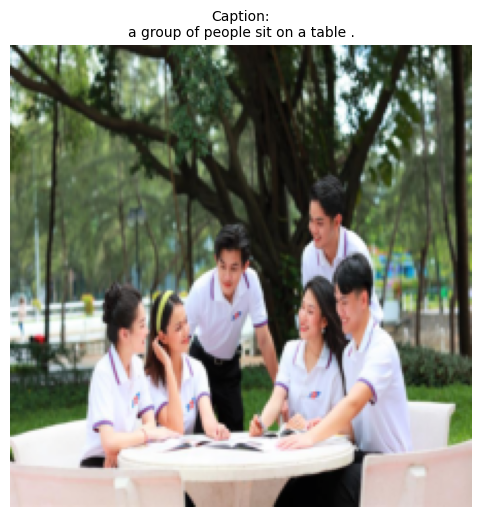

In [55]:
from PIL import Image
from torchvision import transforms
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
from torchvision import models
import math
from google.colab import files


# Parameters
checkpoint = '/content/caption_transformer.pth'  # model checkpoint
VOCAB_PATH = '/content/vocab.json'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # sets device for model and PyTorch tensors
cudnn.benchmark = True  # set to true only if inputs to model are fixed size; otherwise lot of computational overhead

# Load vocab
vocab = Vocabulary.load(VOCAB_PATH)

vocab_size = len(vocab.itos)
pad_idx = vocab.stoi["<pad>"]

word_map = vocab.stoi
model = ImageCaptioningModel(vocab_size=len(word_map), d_model=256, pad_idx=word_map['<pad>'])
model.load_state_dict(torch.load(checkpoint, map_location=device,weights_only=False))
model = model.to(device)
model.eval()

def generate_caption(model, image_tensor, word_map, beam_size=5, max_len=50):
    model.eval()
    vocab_size = len(word_map)
    pad_idx = word_map['<pad>']
    sos_idx = word_map['<sos>']
    eos_idx = word_map['<eos>']

    with torch.no_grad():
        image_tensor = image_tensor.to(device)  # (1, 3, H, W)
        encoder_out = model.encoder(image_tensor)  # (1, S, D)
        encoder_out = encoder_out.expand(beam_size, -1, -1)

        seqs = torch.LongTensor([[sos_idx]] * beam_size).to(device)
        top_k_scores = torch.zeros(beam_size, 1).to(device)

        complete_seqs = []
        complete_scores = []

        step = 1
        while True:
            tgt_input = seqs
            out = model.decoder(encoder_out, tgt_input)
            out = F.log_softmax(out, dim=-1)
            scores = out[:, -1, :]  # (beam, vocab_size)
            scores = top_k_scores.expand_as(scores) + scores

            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(beam_size, 0, True, True)
            else:
                top_k_scores, top_k_words = scores.view(-1).topk(beam_size, 0, True, True)

            prev_word_inds = top_k_words // vocab_size
            next_word_inds = top_k_words % vocab_size

            seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)

            incomplete_inds = [i for i, w in enumerate(next_word_inds) if w != eos_idx]
            complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

            if len(complete_inds) > 0:
                complete_seqs.extend(seqs[complete_inds].tolist())
                complete_scores.extend(top_k_scores[complete_inds])

            beam_size -= len(complete_inds)
            if beam_size == 0 or step > max_len:
                break

            seqs = seqs[incomplete_inds]
            encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
            top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
            step += 1

        if len(complete_scores) == 0:
            seq = seqs[0].tolist()
        else:
            best_idx = complete_scores.index(max(complete_scores))
            seq = complete_seqs[best_idx]

        return seq


rev_word_map = {v: k for k, v in word_map.items()}



# Hiển thị hộp thoại chọn ảnh từ máy
uploaded = files.upload()
# Lấy tên file ảnh đầu tiên vừa upload
image_path = list(uploaded.keys())[0]
# Transform giống như khi training
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load và transform ảnh
image = Image.open(image_path).convert('RGB')
image_tensor = transform(image).unsqueeze(0)  # (1, 3, H, W)
# Sinh caption
seq = generate_caption(model, image_tensor, word_map, beam_size=5)

# Convert id -> từ
caption_words = [rev_word_map[idx] for idx in seq if idx not in {
    word_map['<sos>'], word_map['<eos>'], word_map['<pad>']}]
caption = ' '.join(caption_words)

# Chuyển tensor về ảnh hiển thị
image_np = image_tensor.squeeze(0).numpy().transpose(1, 2, 0)
image_np = image_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
image_np = np.clip(image_np, 0, 1)

# Hiển thị
plt.figure(figsize=(6, 6))
plt.imshow(image_np)
plt.axis('off')
plt.title(f"Caption:\n{caption}", fontsize=10)
plt.show()
